# Figure 3 Notebook
Originally written by Derek Bogdanoff, edited for portability/clarity by George Hartoularos

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.cm as cm
import seaborn as sns
import numpy as np
import scanpy.api as sc
import scipy
import warnings
from tqdm.notebook import tqdm
import pickle as pkl
from matplotlib.patches import Polygon

/home/ssm-user/anaconda3/envs/xyzeq/lib/python3.6/site-packages/scanpy/api/__init__.py:7: FutureWarning: 

In a future version of Scanpy, `scanpy.api` will be removed.
Simply use `import scanpy as sc` and `import scanpy.external as sce` instead.

  FutureWarning,


Some housekeeping:

In [2]:
sc.settings.verbosity=4
sc.settings.set_figure_params(dpi=80)
sc.logging.print_versions()

scanpy==1.5.1 anndata==0.7.4 umap==0.4.6 numpy==1.18.5 scipy==1.4.1 pandas==1.0.5 scikit-learn==0.23.1 statsmodels==0.11.1 python-igraph==0.8.2 leidenalg==0.8.1


In [3]:
with open('../../path.to.data.txt', 'r') as file:
    prefix = file.readline().strip()

_GH:_ I've collapsed the next several cells. They were loading in a counts matrix (which was probably the raw output from the counting/alignment pipeline. However, Derek had converted it into an h5ad, which I load in further below and which is used to create the figures in the paper. As in the notebook for Figure 1, @Derek should upload the original files to Box if we'd like to convert them here. Otherwise can just provide the h5ad to the community.

In [4]:
# #designate working directory 
# #path should contain: matrix.mtx, plate_map.csv, cell_annotate.txt
# #for scanpy annotations: barcodes.tsv, genes.tsv
# path="/Users/derekbogdanoff/projects/XYZeq/data/20190917/"

In [5]:
# array_columns=['gene','cell','count']
# count_matrix=pd.read_csv(path + 'matrix.mtx', sep=' ', header=None, index_col=None, skiprows=3, names=array_columns)

In [6]:
# prefix 

In [7]:
# #check the format of the data
# count_matrix.head()

In [8]:
# ##show some metrics for the data 

# total_UMIS=count_matrix['count'].sum()
# cell_number=count_matrix['cell'].nunique()

# print("number of UMIs total:", total_UMIS)
# print("number of cells:", cell_number)

# plt.rcParams['figure.figsize'] = [5, 5]

# #UMIs per cell
# UMIs=count_matrix.groupby('cell')['count'].sum()

# q=UMIs.quantile(.95)
# UMIs=UMIs[UMIs < q]

# ax=sns.violinplot(UMIs, orient='v', color='#9467bd')
# ax.set(ylabel='Transcripts', xlabel='All Cells Pre-filtering')
# plt.grid(True)
# plt.show()

# #genes per cell
# genes=count_matrix.groupby('cell')['gene'].nunique()

# q=genes.quantile(0.95)
# genes=genes[genes < q]

# ax=sns.violinplot(genes, orient='v', color='#9467bd')
# ax.set(ylabel='Genes', xlabel='All Cells Pre-filtering')
# plt.grid(True)
# plt.show()

# #make UMI knee plot

# counts=UMIs.reset_index()
# counts=counts.sort_values(by=['count'], axis=0, ascending=True)
# counts=counts.reset_index()
# counts=counts.drop('index',axis=1)
# counts=counts.reset_index()
# counts.columns=['barcodes','cell','UMIs/cell']
# plt.rcParams['figure.figsize'] = [13, 8]
# counts.plot.scatter(x='UMIs/cell',y='barcodes')

In [9]:
# pwd

In [10]:
# cd ./scripts/

In [11]:
# from hex_spatial_map import plot_spatial_array

In [12]:
# cd ..

In [13]:
# plot_spatial_array(path+'matrix.mtx', path+'cell_annotate.txt', 
#                    path+'gene_name_annotate.txt', 
#                    path+'plate23_map.csv','mm10_Dpyd', 0)

In [14]:
# plot_spatial_array(path+'matrix.mtx', path+'cell_annotate_L20C1.txt', 
#                    path+'gene_name_annotate.txt', 
#                    path+'plate23_map.csv','mm10_Ahnak', 0)

In [15]:
# sc.settings.verbosity=3
# sc.settings.set_figure_params(dpi=80)
# sc.logging.print_versions()
# results_file = './write/results.h5ad'

# #sc.settings = True

# ##load the data
# adata=sc.read(path + 'matrix_mergedIntron.mtx', cache=False).T

# # ##name the genes
# adata.var_names = [gene.strip() for gene in open(path + 'genes.tsv', 'r')]

# # ##name the cells
# adata.obs_names = [barcode.strip() for barcode in open(path + 'barcodes.tsv', 'r')] 

In [16]:
# adata.var_names_make_unique()

In [17]:
# adata=adata[adata.obs_names.str.contains('L20C1')]

In [18]:
# adata.obs_names

## Load Matrix and Filter

In [4]:
adata = sc.read_h5ad(prefix + 'old_directories/20190920/20190920_L20C1.h5ad')

normalizing counts per cell
    finished (0:00:00)


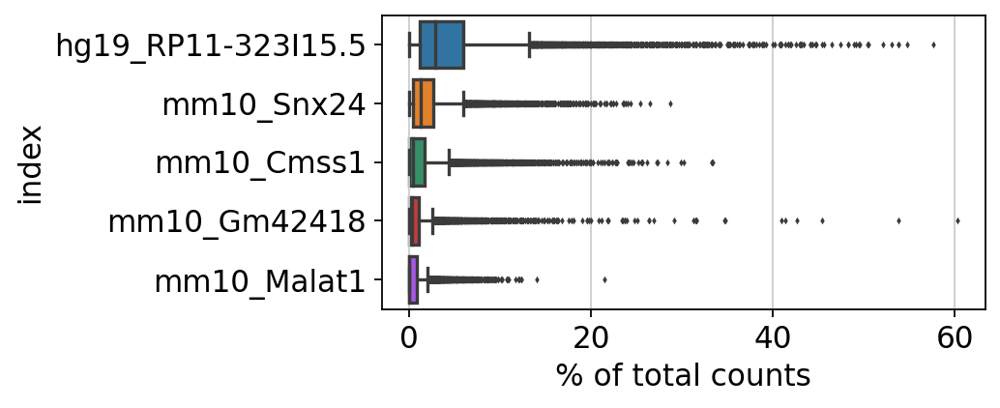

In [20]:
sc.pl.highest_expr_genes(adata, n_top=5) 

In [21]:
adata

AnnData object with n_obs × n_vars = 26436 × 121472

In [22]:
##post processing filter minimum UMIS and genes
sc.pp.filter_cells(adata, min_counts=500)#300
sc.pp.filter_cells(adata, min_genes=100)

#sc.pp.filter_cells(adata, max_counts=15000)
#sc.pp.filter_cells(adata, max_genes=2000) 

##post processing filter genes 
sc.pp.filter_genes(adata, min_cells=2)
#sc.pp.filter_genes(adata, max_cells=1000)   

## define mito genes 
mito_genes=[name for name in adata.var_names if name.startswith(('mm10_mt-', 'hg19_mt-', 'mt-'))]


##create new obs anotation to define percent mito for each cell 
adata.obs['percent_mito'] = np.sum(adata[:, mito_genes].X, axis=1) / np.sum(adata.X, axis=1)*100

##create new obs anotation to define UMIs per cell
adata.obs['n_counts'] = adata.X.sum(axis=1)

filtered out 18293 cells that have less than 500 counts
filtered out 3 cells that have less than 100 genes expressed
filtered out 71226 genes that are detected in less than 2 cells


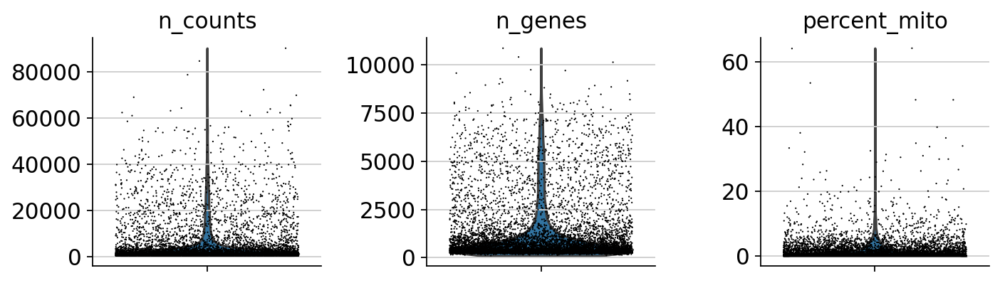

In [23]:
sc.pl.violin(adata, ['n_counts', 'n_genes', 'percent_mito'], jitter=0.4, multi_panel=True)

_GH_: Some genes were removed, we will need to address this or mention it in the text.

In [24]:
spec_filter= [name for name in adata.var_names if not name.startswith('mm10_Itgam')]
adata=adata[:, spec_filter]

In [25]:
spec_filter= [name for name in adata.var_names if not name.startswith('mm10_Smim20')]
adata=adata[:, spec_filter]

In [26]:
spec_filter= [name for name in adata.var_names if not name.startswith('hg19_RP11-323I15.5')]
adata=adata[:, spec_filter]

In [27]:
##filter out outliers
adata = adata[adata.obs['n_genes'] < 15000, :]
adata = adata[adata.obs['n_counts'] < 10000, :]
adata = adata[adata.obs['percent_mito'] < 1, :]

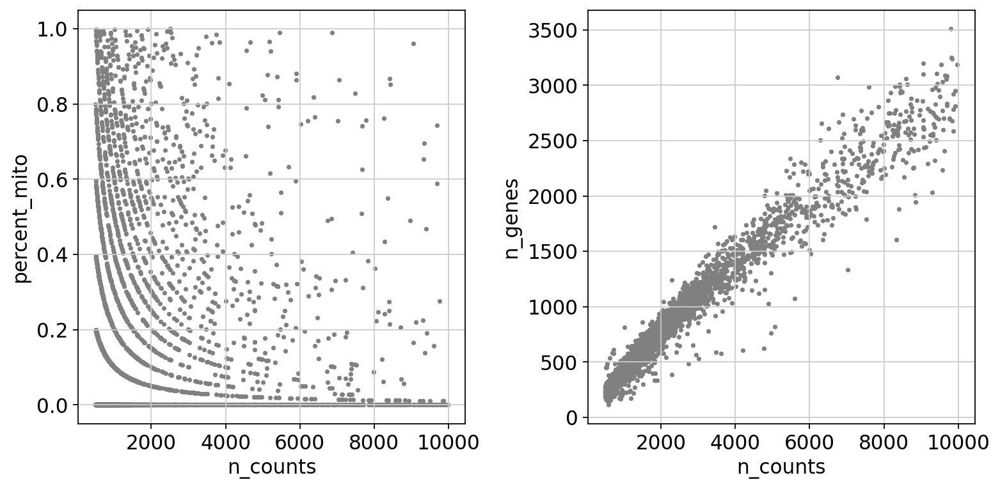

In [28]:
fig, ax = plt.subplots(1,2,figsize=(10,5))
for y, ax in zip(['percent_mito', 'n_genes'], ax):
    ax.scatter(adata.obs['n_counts'].values, adata.obs[y].values, color='gray', s=5)
    ax.set_xlabel('n_counts')
    ax.set_ylabel(y)
plt.tight_layout()

## Make Barnyard

In [29]:
mouse_genes=[name for name in adata.var_names if name.startswith('mm10_')]
human_genes=[name for name in adata.var_names if name.startswith('hg19_')]

adata.obs['mouse_counts'] = np.sum(adata[:, mouse_genes].X, axis=1)
adata.obs['human_counts'] = np.sum(adata[:, human_genes].X, axis=1)

Trying to set attribute `.obs` of view, copying.


In [30]:
cmap = mpl.colors.ListedColormap(['royalblue','lightgrey', 'orangered'])

In [31]:
np.seterr(divide = 'ignore') 
adata.obs['ratio'] = np.log10(np.true_divide(adata.obs['mouse_counts'], adata.obs['human_counts']))

def cell_call(counts):
    if counts['ratio'] > 0.66:
        return 'M'
    elif counts['ratio'] < -0.66:
        return 'H'
    else:
        return 'C'

adata.obs['cell_call']=adata.obs.apply(lambda counts: cell_call(counts), axis=1)

### Figure 2A:

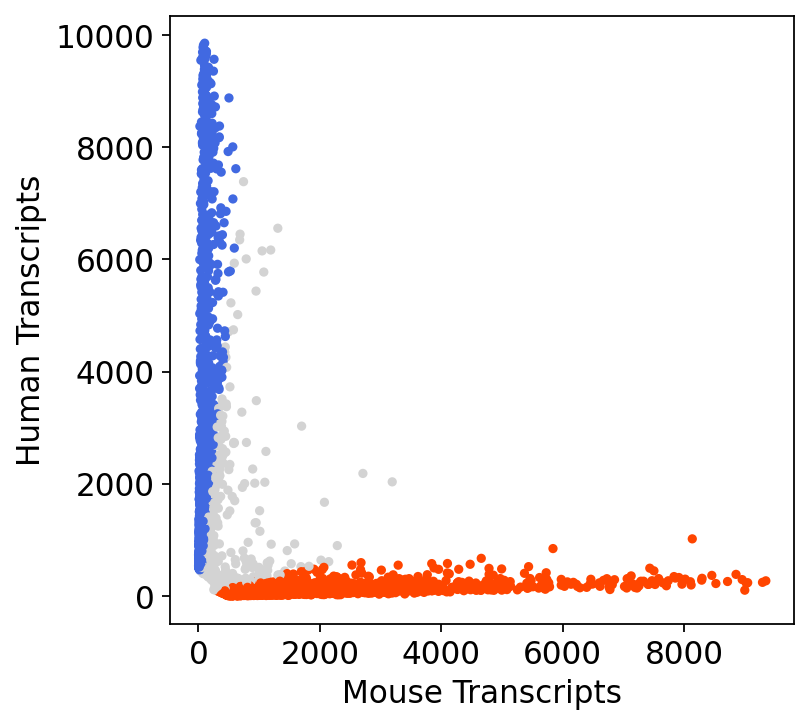

In [32]:
plt.figure(figsize=(5, 5))
plt.scatter(x=adata.obs['mouse_counts'], 
            y=adata.obs['human_counts'],
            s=10,
            c=adata.obs['ratio'],
           cmap=cmap)

plt.xlabel('Mouse Transcripts')
plt.ylabel('Human Transcripts')
plt.grid(b=False)

### Figure 2B:

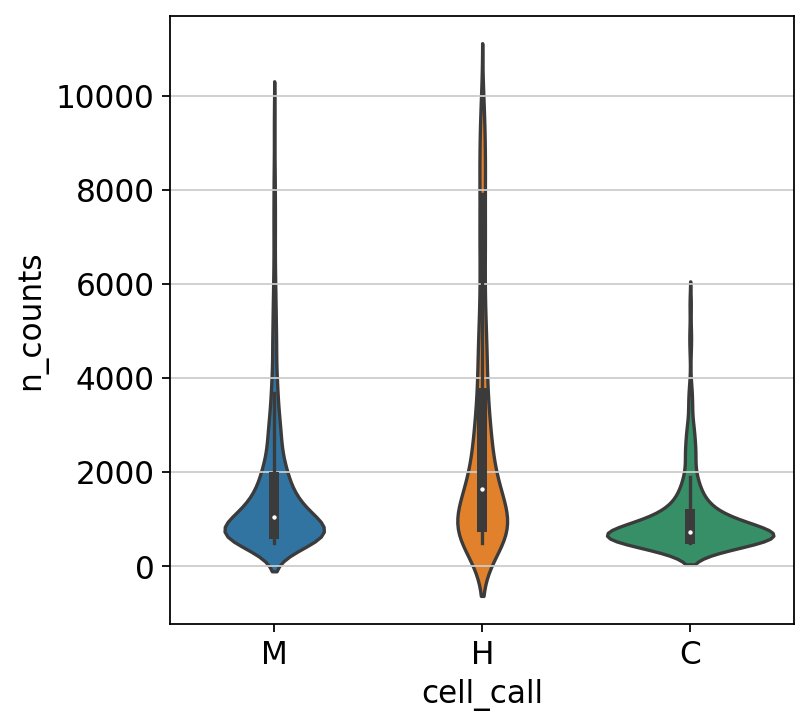

In [33]:
plt.figure(figsize=(5,5))
sns.violinplot(data=adata.obs,
               x='cell_call',
               y='n_counts',
              );

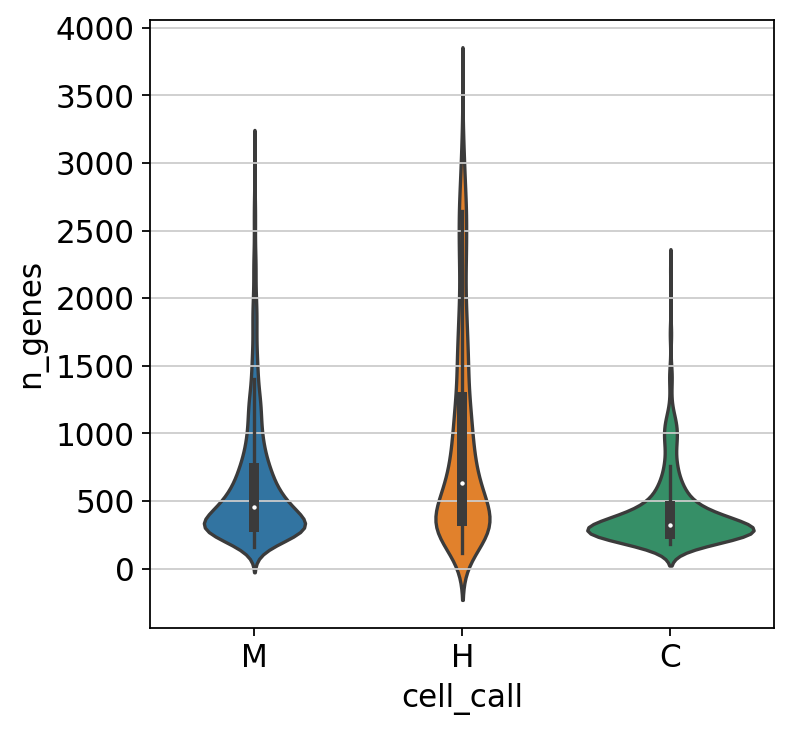

In [34]:
plt.figure(figsize=(5,5))
sns.violinplot(data=adata.obs,
               x='cell_call',
               y='n_genes',
              );

In [35]:
adata.obs['cell_call'].value_counts()

M    2700
H    1625
C     463
Name: cell_call, dtype: int64

In [36]:
np.median(adata[adata.obs['cell_call']=='M'].obs.n_genes)

456.0

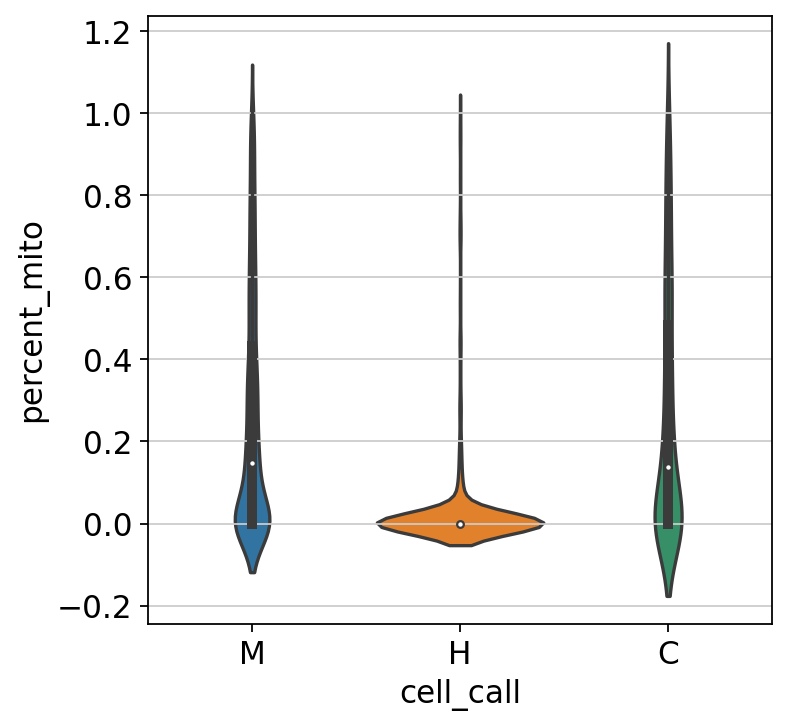

In [37]:
plt.figure(figsize=(5,5))
sns.violinplot(data=adata.obs, x='cell_call', y='percent_mito');

## Gene Filtering, Dimensionality Reduction, and Clustering

In [38]:
##create raw data file
adata.raw = sc.pp.log1p(adata, copy=True)

In [39]:
##normalize counts per cell to 10K each 
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [40]:
print(adata.X.sum(axis=1))

[[10000.   ]
 [ 9999.999]
 [ 9999.999]
 ...
 [10000.   ]
 [10000.   ]
 [10000.002]]


In [41]:
adata.shape

(4788, 50241)

In [42]:
filter_result = sc.pp.filter_genes_dispersion(
    adata.X, min_mean=0.35, max_mean=7, min_disp=1) ####L20C1 parameters 

extracting highly variable genes
    Gene indices [27844, 48550, 49318] fell into a single bin: their normalized dispersion was set to 1.
    Decreasing `n_bins` will likely avoid this effect.
    finished (0:00:03)


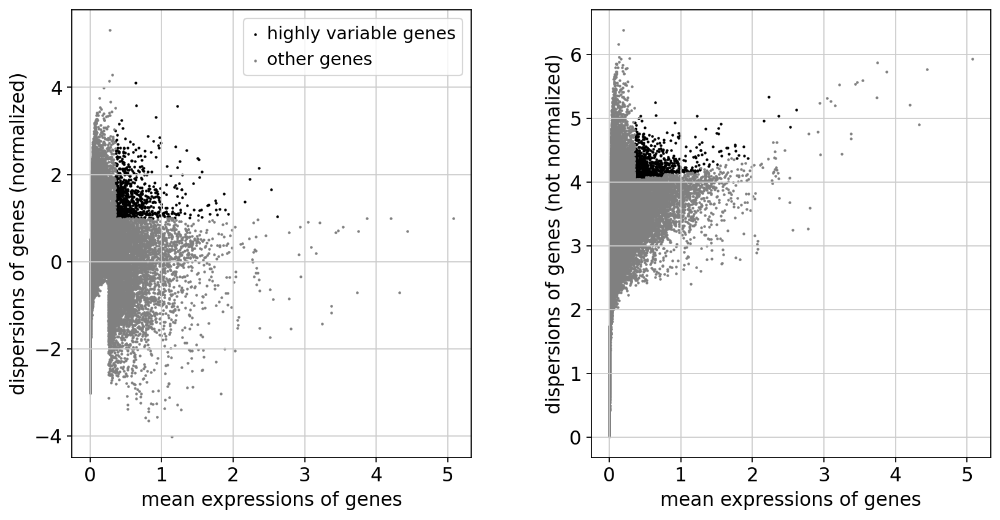

In [43]:
plt.rcParams['figure.figsize'] = (6, 6)
sc.pl.filter_genes_dispersion(filter_result)

In [44]:
filter_result

rec.array([(False, 1.1702676e-03, 0.36014685, -2.6226437 ),
           (False, 1.0000000e-12,        nan,         nan),
           (False, 1.1697747e-02, 2.2933304 , -0.49871564), ...,
           (False, 1.4190648e+00, 3.3346806 , -1.4423531 ),
           (False, 2.6195079e-01, 3.5203974 , -0.20583719),
           (False, 3.8959139e-03, 2.3415518 , -0.44573644)],
          dtype=[('gene_subset', '?'), ('means', '<f4'), ('dispersions', '<f4'), ('dispersions_norm', '<f4')])

In [45]:
sum(filter_result.gene_subset)

789

In [46]:
#percent of genes that are highly variable
sum(filter_result.gene_subset)/len(filter_result.gene_subset)*100

1.570430524870126

In [47]:
adata = adata[:, filter_result.gene_subset].copy()

In [48]:
adata

AnnData object with n_obs × n_vars = 4788 × 789
    obs: 'n_counts', 'n_genes', 'percent_mito', 'mouse_counts', 'human_counts', 'ratio', 'cell_call'
    var: 'n_cells'

In [49]:
sc.pp.log1p(adata)

In [50]:
adata.X


<4788x789 sparse matrix of type '<class 'numpy.float32'>'
	with 172497 stored elements in Compressed Sparse Row format>

In [51]:
#Regress out unwanted sources of variation
sc.pp.regress_out(adata, ['n_counts', 'percent_mito'])

regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use


... storing 'cell_call' as categorical


    finished (0:00:05)


In [52]:
sc.pp.scale(adata, max_value=10)

    ... clipping at max_value 10


In [53]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    with n_comps=50
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


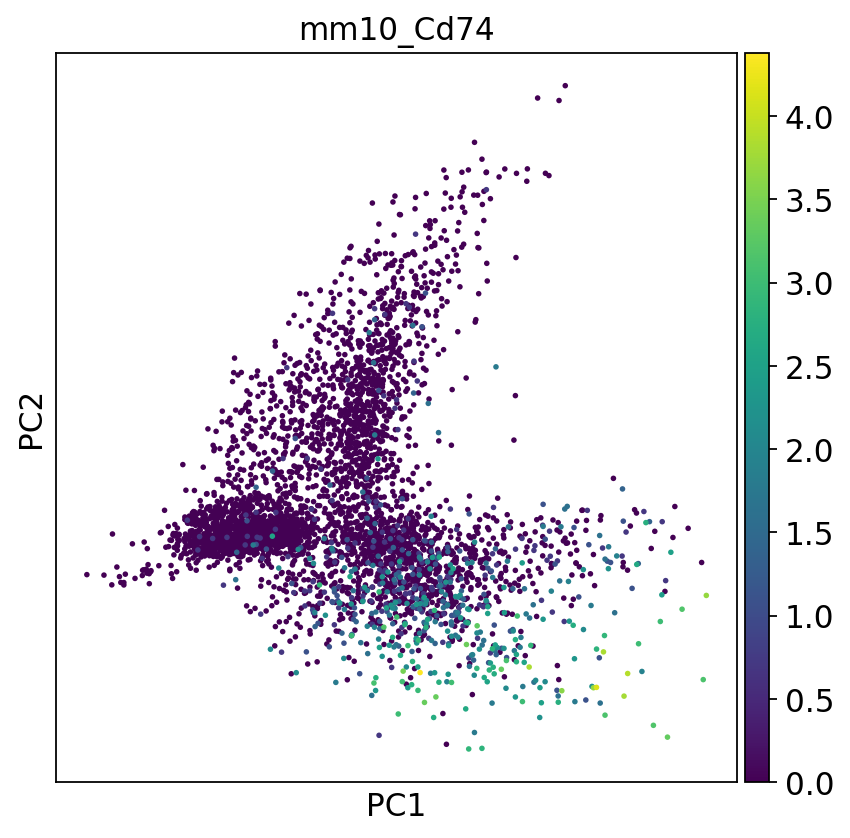

In [54]:
sc.pl.pca(adata,color='mm10_Cd74')

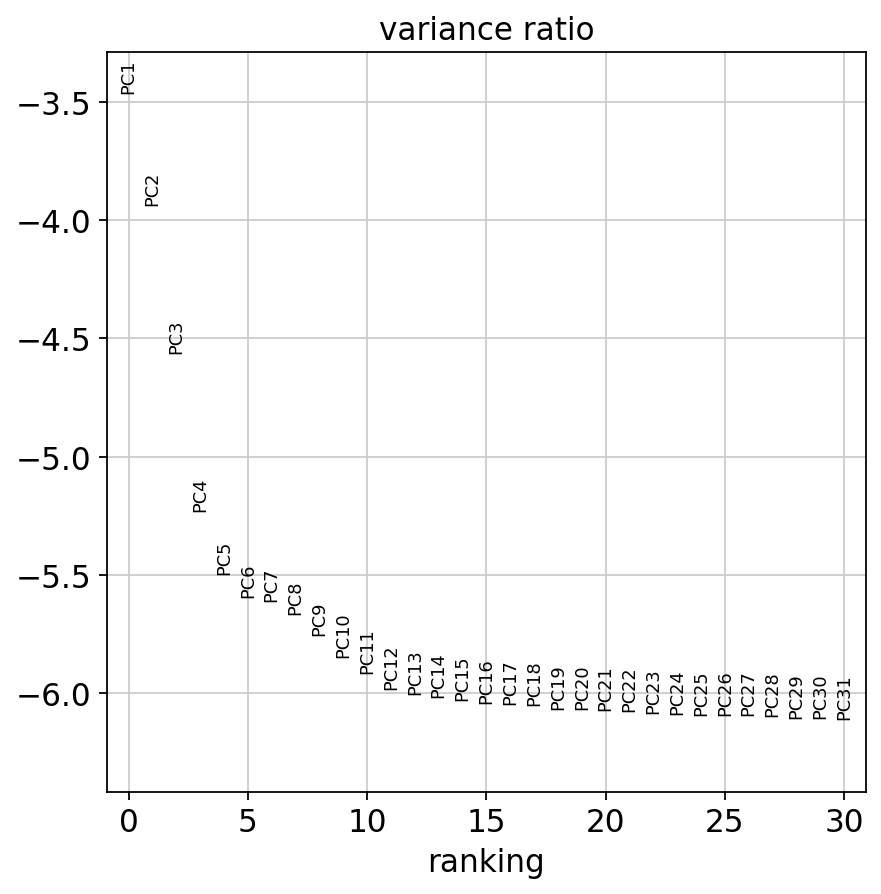

In [55]:
sc.pl.pca_variance_ratio(adata, log=True)

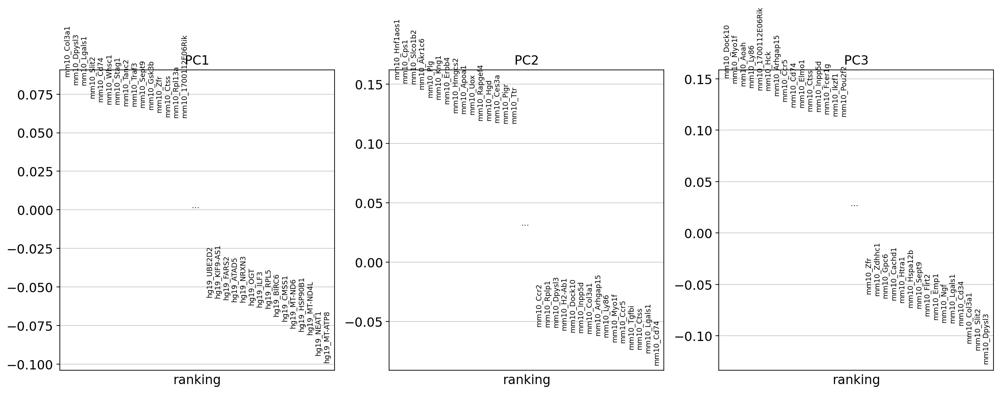

In [56]:
sc.pl.pca_loadings(adata)

_GH_: The following cell normally produces a lot warnings in the terminal, which are known by Scanpy developers to produced by the `numba` package but shouldn't affect functionality. I filter out the warnings to prevent flooding with red text.

In [57]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(adata, n_neighbors=12, n_pcs=10)
warnings.filterwarnings('default')

computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 10
    computed neighbors (0:00:00)
    computed connectivities (0:00:03)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)


In [58]:
sc.tl.leiden(adata, resolution=0.6)

running Leiden clustering
    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


_GH_: Commenting this out since we haven't really been using the Louvain clusters in any analyses. 

In [59]:
# sc.tl.louvain(adata, resolution=0.8)

In [60]:
sc.tl.umap(adata,
            min_dist=.1,
            spread=2,
            alpha=2,
            )

computing UMAP
	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


## Visualization

_GH_: I think we should provide the UMAP coordinates in a separate file or just the h5ad with the correct UMAP coordinates and clusters to exactly reproduce the figures in the paper because there is some stochasticity in the output of UMAP and we'll want end users to exactly reproduce our findings.

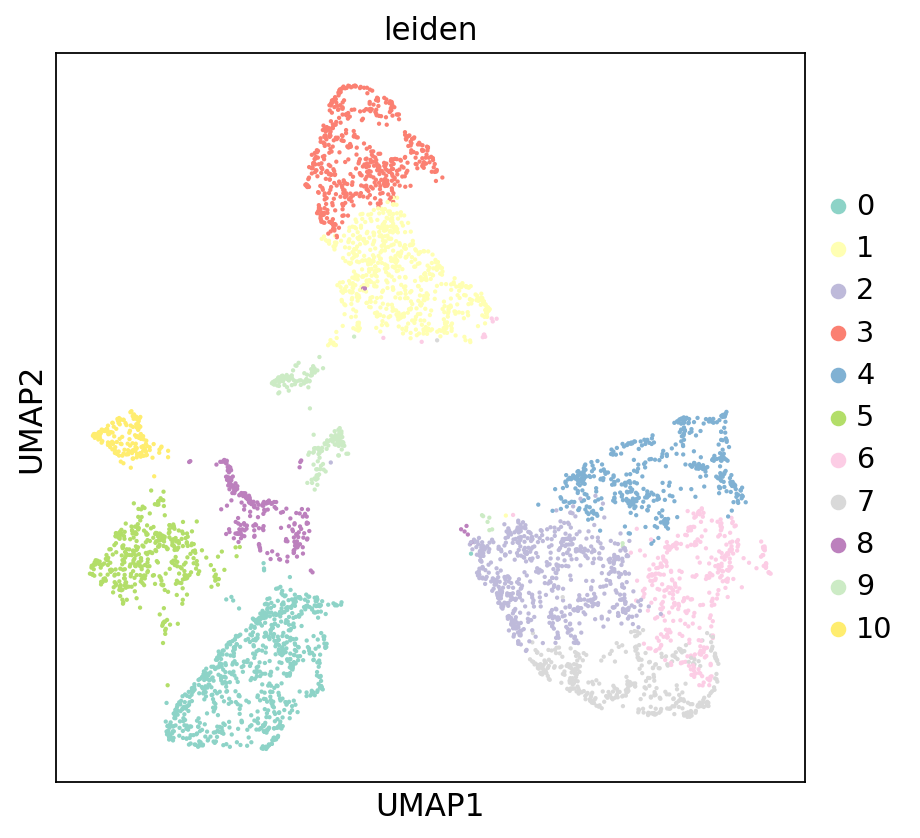

In [61]:
plt.rcParams['figure.figsize'] = (6, 6)

sc.pl.umap(adata, color=['leiden'],
           ncols=1, palette="Set3",
           color_map=mpl.cm.CMRmap,
           size=15)

_GH_: As can be seen, this looks similar to, but not exactly like, the figure in the paper. We'll need to load that in separately if we want people to be able to reproduce it.

_GH_: Commenting out the next two since it requires running `scvi` which I don't see the code for.

In [62]:
# sc.pp.neighbors(adata, n_neighbors=12, n_pcs=40, use_rep="X_scvi")
# sc.tl.umap(adata,
#             min_dist=.1,
#             spread=2,
#             alpha=2,
#             )

In [63]:
# sc.tl.leiden(adata, key_added="leiden_scvi", resolution=0.6)

_GH_: We have two separate files that contain the UMAP coordinates and tSNE coordinates. We should resolve this and figure out how to make them.

In [9]:
paper_l20c1_umap = sc.read_h5ad(prefix + 'Liver/L20C1.h5ad')
paper_l20c1_tsne = sc.read_loom(prefix + 'old_directories/20200324/L20C1_mouse_wTSNE.loom')

/home/ssm-user/anaconda3/envs/xyzeq/lib/python3.6/site-packages/loompy/loom_validator.py:48: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  with h5py.File(path) as f:


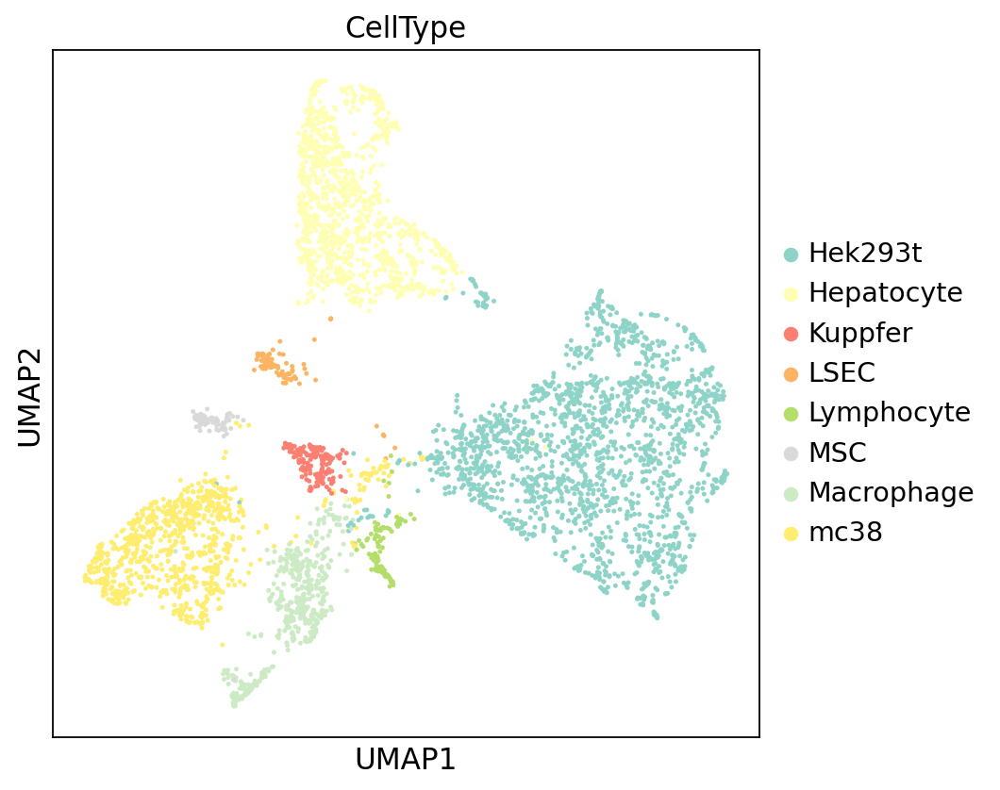

In [65]:
plt.rcParams['figure.figsize'] = (6, 6)

sc.pl.umap(paper_l20c1_umap, color=['CellType'],
           ncols=1, palette="Set3",
           color_map=mpl.cm.CMRmap,
           size=20)

### Figure 3A:

... storing 'CellType' as categorical
... storing 'barcode' as categorical
... storing 'cell_call' as categorical
... storing 'leiden' as categorical
... storing 'louvain' as categorical


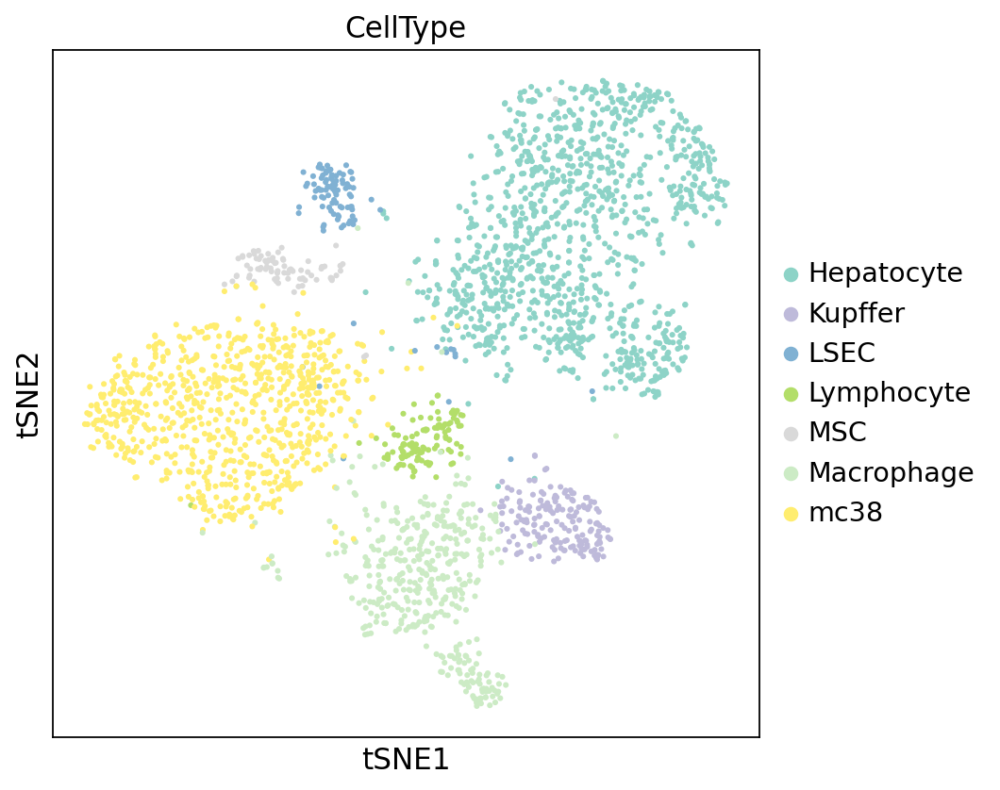

In [66]:
plt.rcParams['figure.figsize'] = (6, 6)

sc.pl.tsne(paper_l20c1_tsne, color=['CellType'],
           ncols=1, palette="Set3",
           color_map=mpl.cm.CMRmap,
           size=30)

## Figure 3F and S4B

In [5]:
path = '/data/xyzeq/xyzeq/individual.raw.and.proc.h5ads/fig3.L20C1/new.adata.6.h5ad'

In [6]:
adata = sc.read_h5ad(path)

In [69]:
counts = dict()

In [70]:
for bc in tqdm(adata.obs['barcode'].unique()):
    df = adata.obs[adata.obs['barcode'] == bc]
    v, c = np.unique(df['CellType'].values, return_counts=True)
    counts[bc] = dict(zip(v,c))

In [71]:
df = pd.DataFrame.from_dict(counts).fillna(0).T

In [72]:
df.drop('Hek293t', axis=1, inplace=True)

In [73]:
df1 = df[['Hepatocyte','Kupffer','LSEC','Lymphocyte','MSC','mc38']]
df2 = df[['Hepatocyte','Macrophage','mc38']]

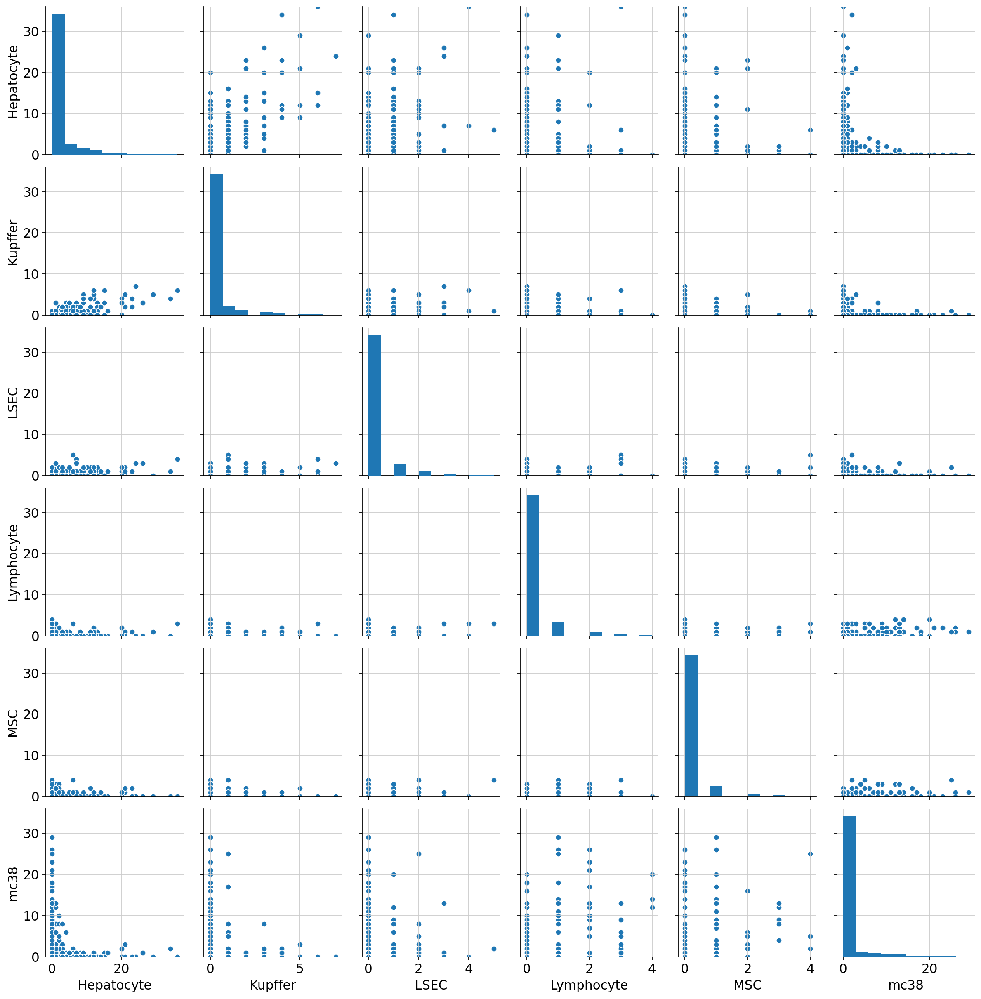

In [74]:
# due to the issue outlines here: https://github.com/mwaskom/seaborn/issues/1369
# we are adjusting the y limits manually
# sns.pairplot(df1);

g = sns.pairplot(df1)
g.set(ylim=(df1.min().min(),df1.max().max()));
# plt.savefig('/data/xyzeq/xyzeq/figures/pairplot.supps.svg')

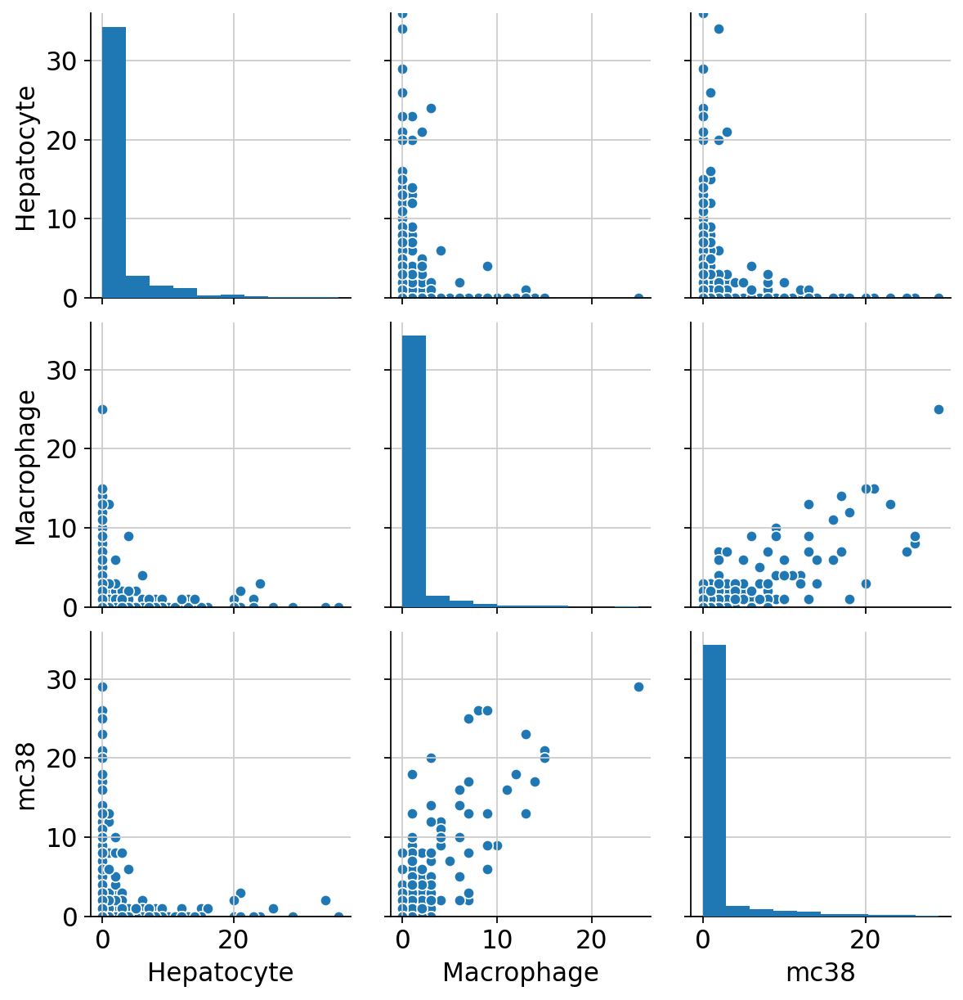

In [75]:
# due to the issue outlines here: https://github.com/mwaskom/seaborn/issues/1369
# we are adjusting the y limits manually
# sns.pairplot(df2);

g = sns.pairplot(df2)
g.set(ylim=(df2.min().min(),df2.max().max()));
# plt.savefig('/data/xyzeq/xyzeq/figures/pairplot.main.svg')

## Figure 3C — Heat Map
Heat map is further down, everything else between here and there is required to get the data in the right format.

In [76]:
local_prefix = '/data/xyzeq'

In [77]:
with open(local_prefix + '/10x/5prime_liver/10x.dimred.pkl', 'rb') as file:
    data = pkl.load(file)
# l20c1 = sc.read_h5ad(prefix + '/10x/5prime_liver/l20c1.dimred.h5ad')

### Load in the XYZeq data

In [78]:
l20c1_prefix = local_prefix + '/xyzeq/individual.raw.and.proc.h5ads/fig3.L20C1/'
l20c1_raw = sc.read_h5ad(l20c1_prefix + 'adata.1.h5ad')
l20c1 = sc.read_h5ad(l20c1_prefix + 'adata.6.h5ad')

/home/ssm-user/anaconda3/envs/xyzeq/lib/python3.6/site-packages/anndata/compat/__init__.py:161: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  FutureWarning,
/home/ssm-user/anaconda3/envs/xyzeq/lib/python3.6/site-packages/anndata/compat/__init__.py:161: FutureWarning: Moving element from .uns['neighbors']['connectivities'] to .obsp['connectivities'].

This is where adjacency matrices should go now.
  FutureWarning,


In [79]:
# l20c1_h = l20c1[:,[i for i in l20c1.var_names if i.startswith('hg19_')]].copy()
# l20c1_h = l20c1_h[l20c1_h.obs['celltype'] == 'Hek293t'].copy()

In [80]:
# l20c1_m = l20c1[:,[i for i in l20c1.var_names if i.startswith('mm10_')]].copy()
# l20c1_m = l20c1_m[l20c1_m.obs['celltype'] != 'Hek293t'].copy()

In [81]:
# l20c1_m.var_names = [i[5:] for i in l20c1_m.var_names]

In [82]:
new_names = list()
for i in l20c1.var_names:
    if i.startswith('hg19_'):
        new_names.append('H_' + i[5:])
    else:
        new_names.append('m_' + i[5:])
l20c1.var_names = new_names

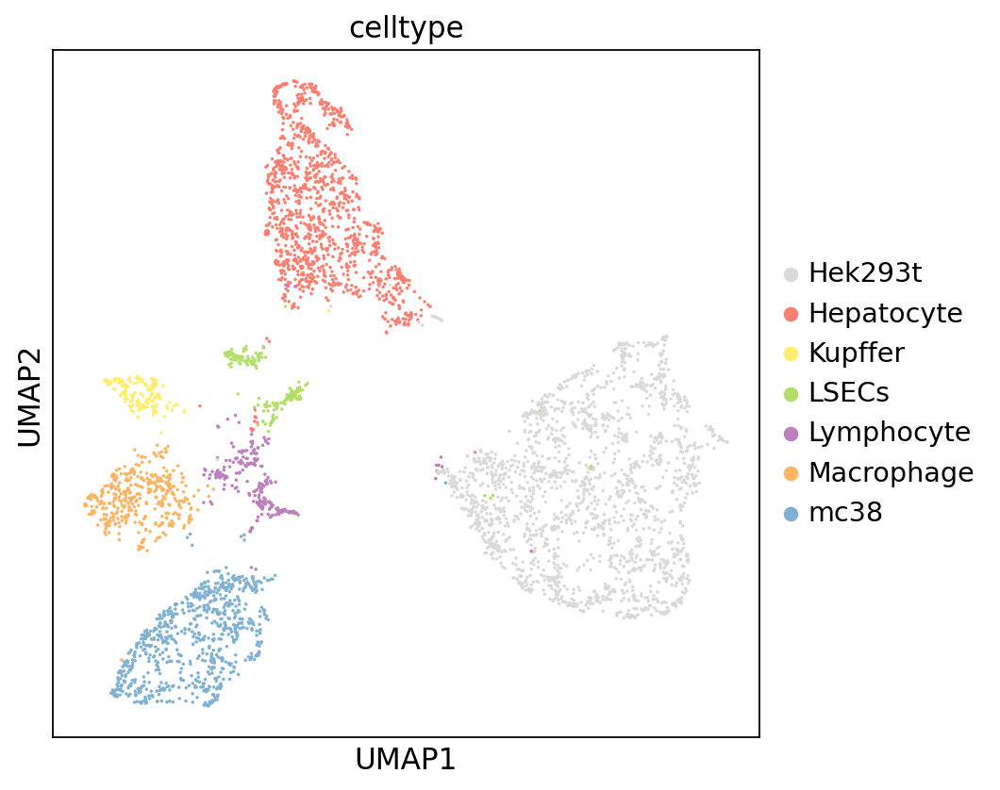

In [83]:
sc.pl.umap(l20c1,color=['celltype'], size=10)

In [84]:
ctdict = dict()
ctdict['XYZ_HEPATOCYTE'] = ['Hepatocyte']
ctdict['XYZ_MPHAGE'] = ['Macrophage']
ctdict['XYZ_KUPFFER'] = ['Kupffer']
ctdict['XYZ_LSEC'] = ['LSECs']
ctdict['XYZ_LYMPH'] = ['Lymphocyte']
ctdict['XYZ_MC38'] = ['mc38']
ctdict['XYZ_HEK293T'] = ['Hek293t']
l20c1.obs['celltype2'] = l20c1.obs['celltype']
for ct in ctdict:
    for clust in ctdict[ct]:
        l20c1.obs['celltype2'].replace(str(clust), ct, regex=True, inplace=True)
l20c1.obs['celltype2'] = l20c1.obs['celltype2'].astype('category')

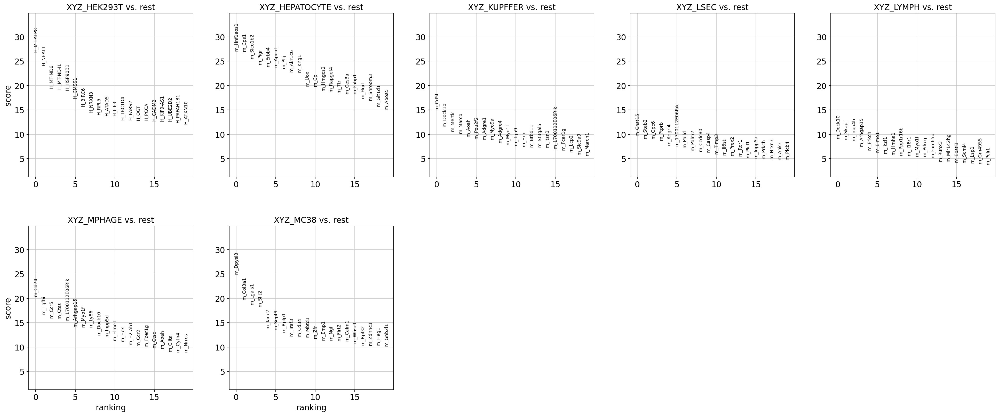

In [85]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(l20c1, groupby='celltype2', use_raw=False)
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(l20c1, ncols=5)
sc.settings.verbosity = 3

In [86]:
for ct in l20c1.obs['celltype2'].unique():
    print(ct + ': ' + ', '.join([i.strip('m_') for i in l20c1.uns['rank_genes_groups']['names'][ct][:20]]))

XYZ_HEPATOCYTE: Hnf1aos1, Cps1, Slco1b2, Pigr, Erbb4, Apoa1, Plg, Akr1c6, Kng1, Uox, Cp, Hmgcs2, Rapgef4, Ttr, Ces3a, Fabp1, Hgd, Shroom3, Glt1d1, Apoa5
XYZ_HEK293T: H_MT-ATP8, H_NEAT1, H_MT-ND6, H_MT-ND4L, H_HSP90B1, H_CMSS1, H_BIRC6, H_NRXN3, H_RPL5, H_ATAD5, H_ILF3, H_TBC1D4, H_FARS2, H_OGT, H_PCCA, H_CADM2, H_KIF9-AS1, H_UBE2D2, H_PAFAH1B1, H_ATXN10
XYZ_KUPFFER: Cd5l, Dock10, Mertk, Marco, Aoah, Pou2f2, Adgre1, Myo9a, Adgre4, Myo1f, Itga9, Hck, Btbd11, St3gal5, Itsn1, 1700112E06Rik, Fcer1g, Lcp2, Slc9a9, March1
XYZ_LYMPH: Dock10, Skap1, Inpp4b, Arhgap15, Prkch, Elmo1, Ikzf1, Hmha1, Ppp1r16b, Il18r1, Myo1f, Prkcq, Fam65b, Runx3, Mir142hg, Epsti1, Scml4, Lsp1, Gm4955, Peli1
XYZ_LSEC: Chst15, Stab2, Gpc6, Ptprb, Adgrl4, 1700112E06Rik, Palld, Palm2, Ccdc80, Casp4, Timp3, Il6st, Prex2, Ror1, Plcl1, Inpp5a, Prkch, Nrxn3, Ank3, Plcb4
XYZ_MPHAGE: Cd74, Tgfbi, Ccr5, Ctss, 1700112E06Rik, Arhgap15, Myo1f, Ly86, Dock10, Inpp5d, Elmo1, Hck, H2-Ab1, Ccr2, Fcer1g, Ctsc, Aoah, Ciita, Cyth4, Nrros


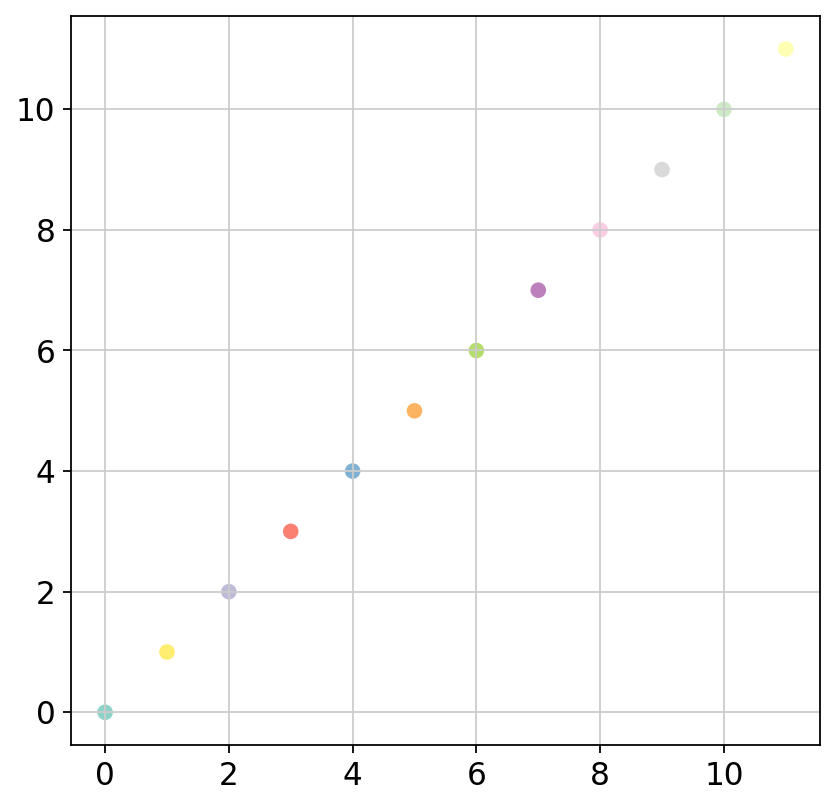

In [87]:
plt.scatter(np.arange(12), np.arange(12), c=['#8DD3C7', '#FFED6F', '#BEBADA', '#FB8072', '#80B1D3', '#FDB462', '#B3DE69', '#BC80BD', '#FCCDE5', '#D9D9D9', '#CCEBC5', '#FFFFB3'])
colors = dict(zip(['turq','dark yel','light purp','coral','blue','orange','light gr','purp','pink','gray','mint','light yel'],
                  ['#8DD3C7', '#FFED6F', '#BEBADA', '#FB8072', '#80B1D3', '#FDB462', '#B3DE69', '#BC80BD', '#FCCDE5', '#D9D9D9', '#CCEBC5', '#FFFFB3']))

In [88]:
l20c1.uns['celltype2_colors'] = [
    colors['gray'],
    colors['coral'],
    colors['dark yel'],
    colors['light gr'],
    colors['purp'],
    colors['blue'],
    colors['orange']
]

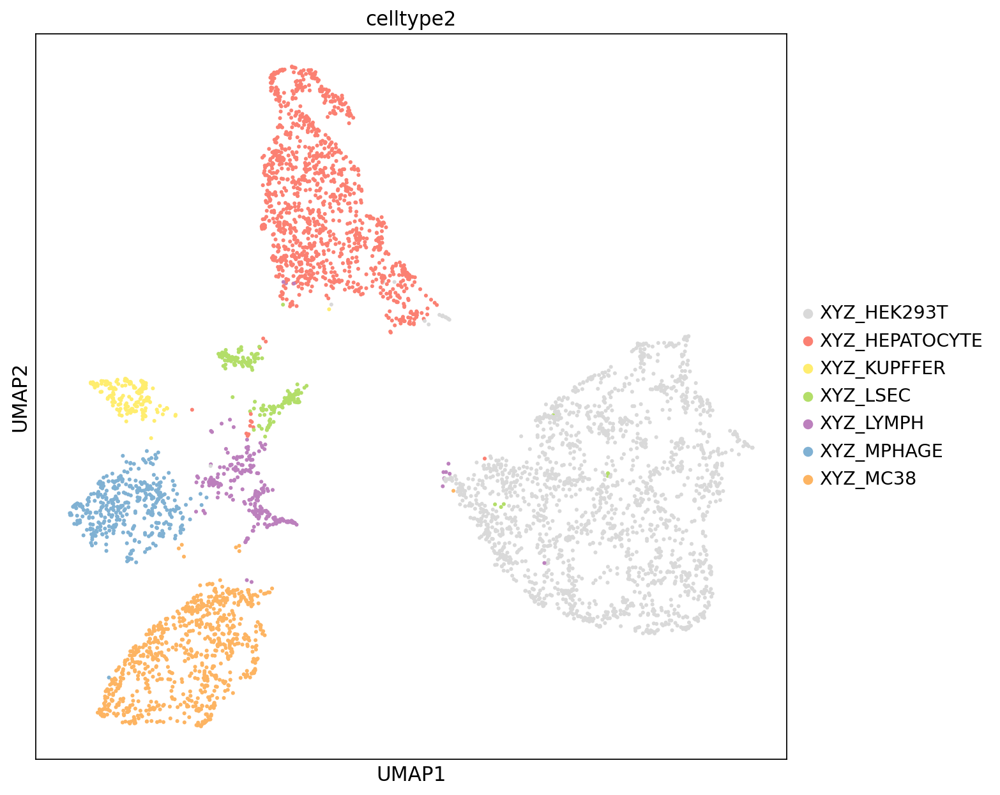

In [89]:
fig, ax = plt.subplots(1,1,figsize=(10, 8))
sc.pl.umap(l20c1,color=['celltype2'], size=30, ax=ax, return_fig=False, show=False)
plt.tight_layout()
# plt.savefig(prefix + '10x/2020112/figures/XYZeq.umap.pdf')

### Cell Type Correlations

Code taken from https://github.com/yelabucsf/lupus_1M_cells_clean/blob/master/figure6_flare/Figure6Flare.V6.ipynb

In [90]:
def marker_gene_expression(anndata, marker_dict, gene_symbol_key=None, partition_key='louvain_r1'):
    """A function go get mean z-score expressions of marker genes
    #
    # Inputs:
    #    anndata        - An AnnData object containing the data set and a partition
    #    marker_dict     - A dictionary with cell-type markers. The markers should be stores as anndata.var_names or
    #                   an anndata.var field with the key given by the gene_symbol_key input
    #    gene_symbol_key - The key for the anndata.var field with gene IDs or names that correspond to the marker
    #                   genes
    #    partition_key   - The key for the anndata.obs field where the cluster IDs are stored. The default is
    #                   'louvain_r1' """

    # Test inputs
    if partition_key not in anndata.obs.columns.values:
        print('KeyError: The partition key was not found in the passed AnnData object.')
        print('   Have you done the clustering? If so, please pass the cluster IDs with the AnnData object!')
        raise

    if (gene_symbol_key != None) and (gene_symbol_key not in anndata.var.columns.values):
        print('KeyError: The provided gene symbol key was not found in the passed AnnData object.')
        print('   Check that your cell type markers are given in a format that your anndata object knows!')
        raise

    if gene_symbol_key:
        gene_ids = anndata.var[gene_symbol_key]
    else:
        gene_ids = anndata.var_names

    clusters = anndata.obs[partition_key].cat.categories
    n_clust = len(clusters)
    marker_exp = pd.DataFrame(columns=clusters)
    marker_exp['cell_type'] = pd.Series({}, dtype='str')
    marker_names = []

    z_scores = sc.pp.scale(anndata, copy=True)

    i = 0
    for group in marker_dict:
        # Find the corresponding columns and get their mean expression in the cluster
        for gene in marker_dict[group]:
            ens_idx = np.in1d(gene_ids, gene) #Note there may be multiple mappings
            if np.sum(ens_idx) == 0:
                continue
            else:
                z_scores.obs[ens_idx[0]] = z_scores.X[:,ens_idx].mean(1) #works for both single and multiple mapping
                ens_idx = ens_idx[0]

            clust_marker_exp = z_scores.obs.groupby(partition_key)[ens_idx].apply(np.mean).tolist()
            clust_marker_exp.append(group)
            marker_exp.loc[i] = clust_marker_exp
            marker_names.append(gene)
            i+=1

    # Replace the rownames with informative gene symbols
    marker_exp.index = marker_names

    return(marker_exp)

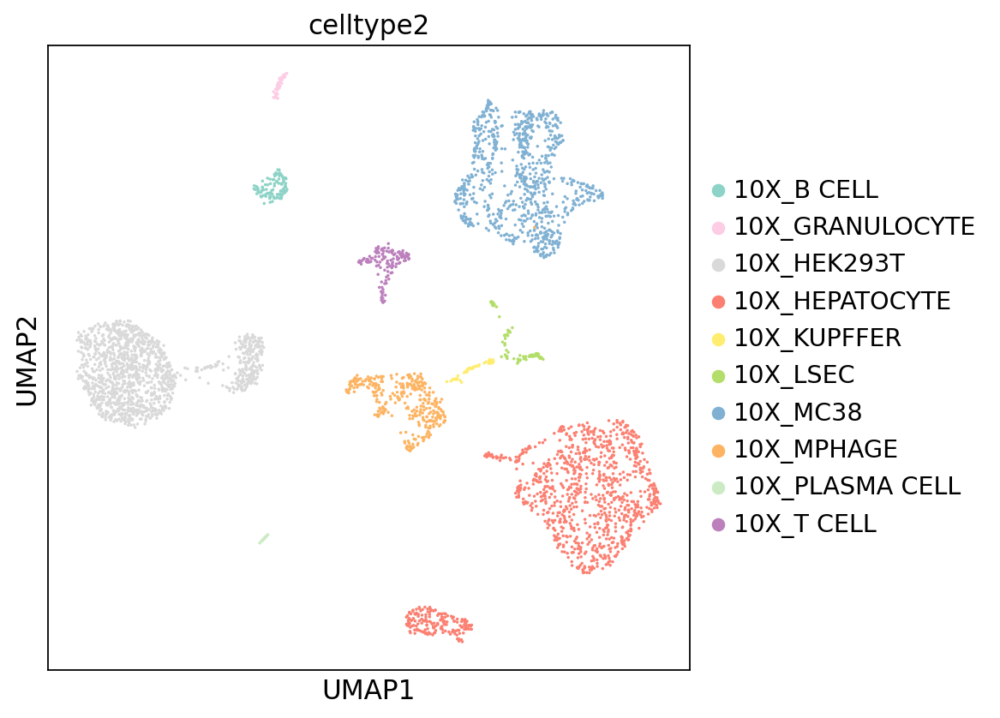

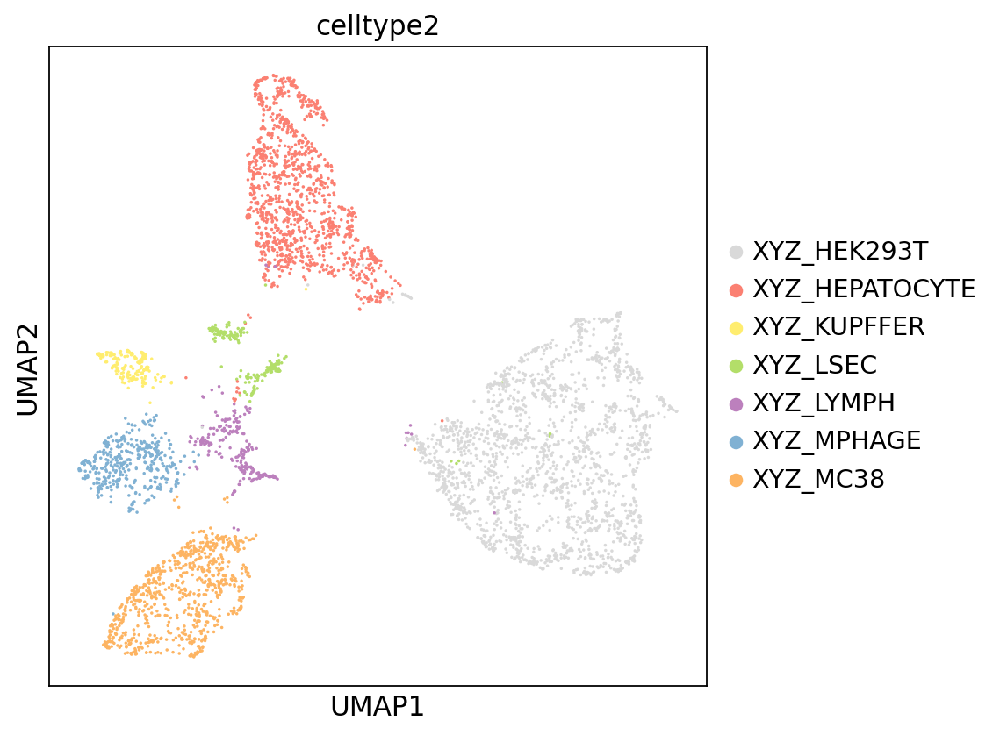

In [91]:
sc.pl.umap(data['adata'],color=['celltype2'], size=10)
sc.pl.umap(l20c1,color=['celltype2'], size=10)

In [92]:
MSC_gene_list = ['m_Rbms3', 'm_Tshz2', 'm_Dlc1', 'm_Prkg1',
       'm_Gpc6', 'm_Pdzrn3', 'm_Kalrn', 'm_Zfpm2',
       'm_Ror1', 'm_Igfbp7', 'm_Ccdc80', 'm_Lhfp',
       'm_Malat1', 'm_Col1a2', 'm_Pde3a', 'm_Zeb2',
       'm_Pcdh7', 'm_Rora', 'm_Sparc', 'm_Col3a1',
       'm_C1qtnf7', 'm_Col5a2', 'm_Cald1', 'm_Palm2',
       'm_Kif26b', 'm_Adamts2', 'm_Bicc1', 'm_Plcl1',
       'm_Sox5', 'm_Sntg1', 'm_Chst15', 'm_Cacna1c',
       'm_Adam12', 'm_Timp3', 'm_Casp4', 'm_Col1a1',
       'm_Pde1a', 'm_Col4a1', 'm_Tmtc1', 'm_Col4a2',
       'm_Adamts12', 'm_Pbx1', 'm_Rbms1', 'm_Col14a1',
       'm_Rnf150', 'm_Magi2', 'm_Setbp1', 'm_Piezo2',
       'm_Nkain2', 'm_Epha3', 'm_Col5a1', 'm_Raph1',
       'm_Glis3', 'm_Cacnb2', 'm_Ephb2', 'm_Ank3',
       'm_Pcdh9', 'm_Chst11', 'm_Sulf1', 'm_Mast4',
       'm_Slit3', 'm_Prickle1', 'm_Clstn2', 'm_Ngf',
       'm_Antxr1', 'm_Zbtb20', 'm_Ncam1', 'm_Foxp1',
       'm_Gpr39', 'm_Tgfb3', 'm_1700112E06Rik',
       'm_Nrxn1', 'm_Plxdc2', 'm_Itga9', 'm_Palld',
       'm_Pknox2', 'm_Nrxn3', 'm_Dse', 'm_Large',
       'm_Kcnt2', 'm_Plekha4', 'm_Parva', 'm_Tns3',
       'm_Nhs', 'm_Fndc3b', 'm_Reln', 'm_Ltbp2',
       'm_Grk5', 'm_Ext1', 'm_Gab2', 'm_Lpp',
       'm_Arhgap24', 'm_Macf1', 'm_Pam', 'm_Cblb',
       'm_Arhgap42', 'm_Bmpr2', 'm_Tmem108',
       'm_Plxna4', 'm_Rerg']

In [93]:
MSCs_genes = list()
for i in MSC_gene_list:
    if i in l20c1.var_names:
        MSCs_genes.append(i)

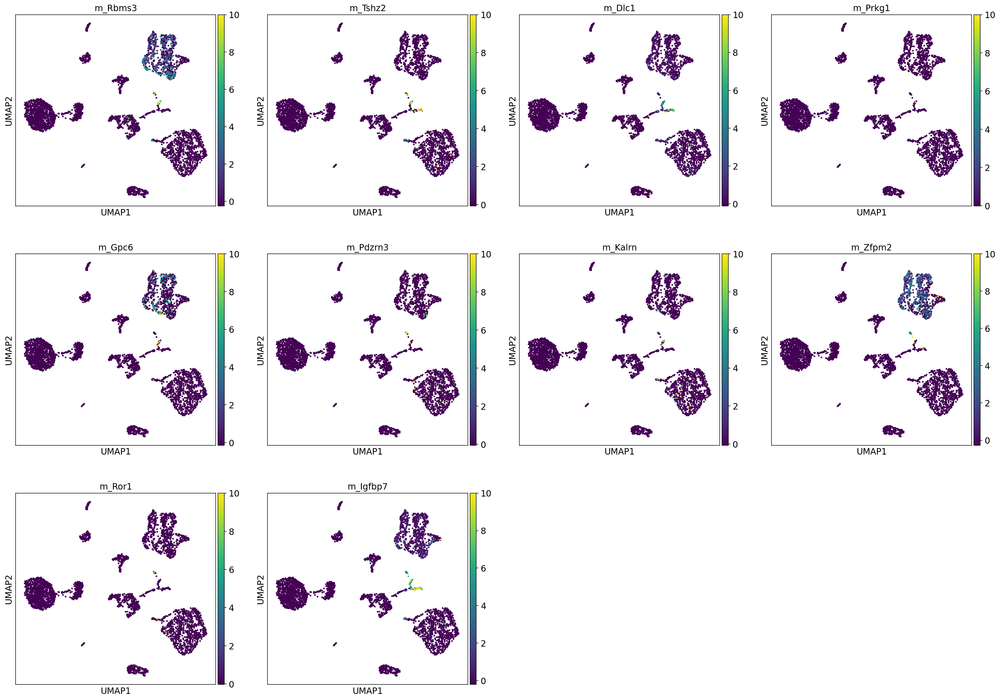

In [94]:
sc.pl.umap(data['adata'], color=MSC_gene_list[:10])

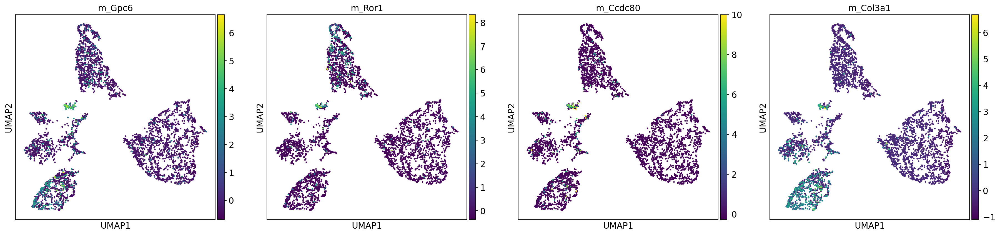

In [95]:
sc.pl.umap(l20c1, color=MSCs_genes[:4])

In [96]:
sc.tl.leiden(l20c1, resolution=0.7)

running Leiden clustering
    finished: found 15 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


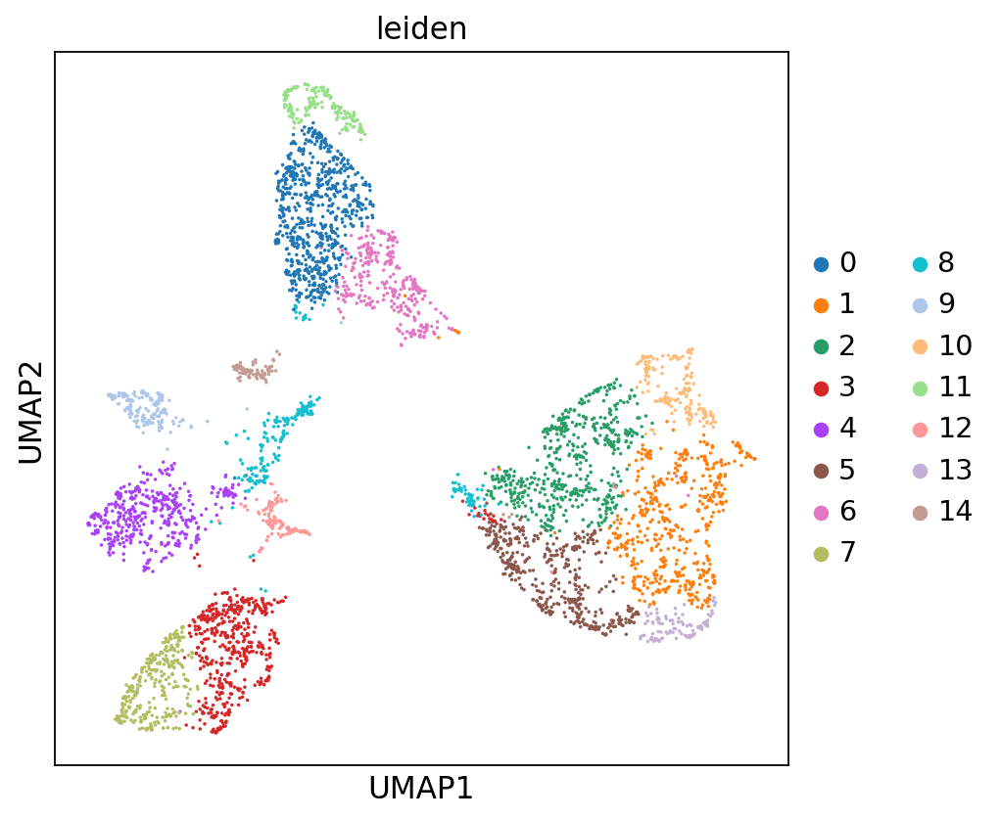

In [97]:
sc.pl.umap(l20c1,color=['leiden'], size=10)

In [98]:
msc_bool = (l20c1.obs['leiden'] == '14').values

In [99]:
celltype2 = list()
for i in range(len(msc_bool)):
    if msc_bool[i] == False:
        celltype2.append(l20c1.obs['celltype2'][i])
    else:
        celltype2.append('XYZ_MSCs')

In [100]:
l20c1.obs['celltype2'] = celltype2

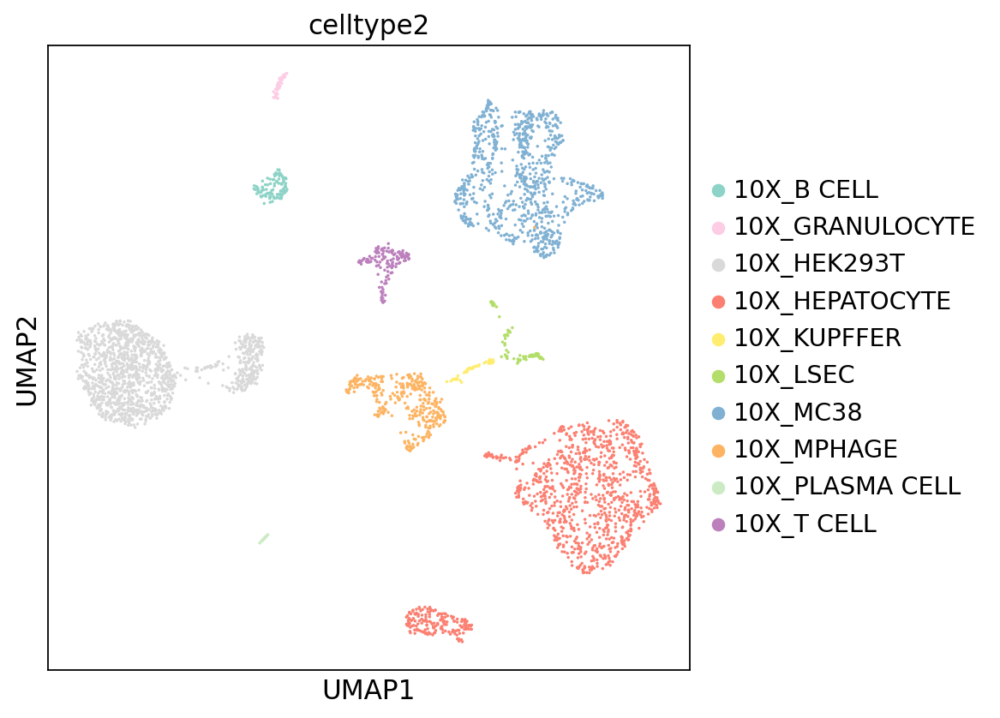

... storing 'celltype2' as categorical


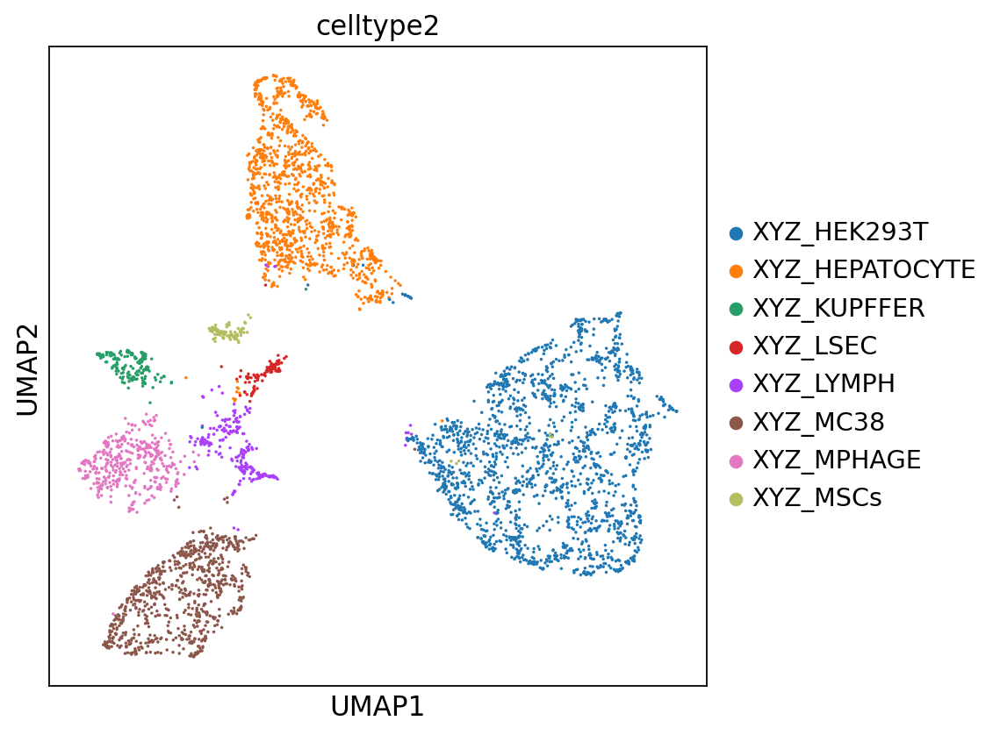

In [101]:
plot = 'celltype2'
sc.pl.umap(data['adata'],color=[plot], size=10)
sc.pl.umap(l20c1,color=[plot], size=10)

In [102]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(l20c1, groupby='celltype2', n_genes=1000)
sc.tl.rank_genes_groups(data['adata'], groupby='celltype2', n_genes=1000)
warnings.filterwarnings('default')
sc.settings.verbosity = 4

In [103]:
cts = data['adata'].obs['celltype2'].unique()
genes = np.concatenate([data['adata'].uns['rank_genes_groups']['names'][ct][:200] for ct in cts])
genes = np.unique(genes)
genes = np.intersect1d(genes, l20c1.var_names.values)
# genes = np.intersect1d(data['adata'].var_names.values, l20c1.var_names.values)

In [104]:
genes.shape

(151,)

In [105]:
marker_dictionary = pd.DataFrame({"all": genes})

In [106]:
l20c1_unscaled = sc.read_h5ad(l20c1_prefix + 'adata.4.h5ad')

In [107]:
l20c1_unscaled = l20c1_unscaled[l20c1.obs_names].copy()

In [108]:
data['adata_unscaled'].obs['celltype2'] = data['adata'].obs['celltype2'].values
l20c1_unscaled.obs['celltype2'] = l20c1.obs['celltype2'].values

In [109]:
new_names = list()
for i in l20c1_unscaled.var_names:
    if i.startswith('hg19_'):
        new_names.append('H_' + i[5:])
    else:
        new_names.append('m_' + i[5:])
l20c1_unscaled.var_names = new_names

In [110]:
marker_exp_10x = marker_gene_expression(data['adata_unscaled'], marker_dictionary, partition_key="celltype2")

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [111]:
marker_exp_XYZeq = marker_gene_expression(l20c1_unscaled, marker_dictionary, partition_key="celltype2")

In [112]:
exp_result = pd.concat([marker_exp_10x, marker_exp_XYZeq], axis=1, join='inner')

In [113]:
exp_result = exp_result[['10X_HEK293T', '10X_MC38', '10X_HEPATOCYTE', '10X_KUPFFER', '10X_MPHAGE', '10X_B CELL', '10X_GRANULOCYTE', '10X_T CELL', '10X_LSEC',
                         'XYZ_HEK293T', 'XYZ_MC38', 'XYZ_HEPATOCYTE', 'XYZ_KUPFFER', 'XYZ_MPHAGE', 'XYZ_LYMPH', 'XYZ_LSEC']]

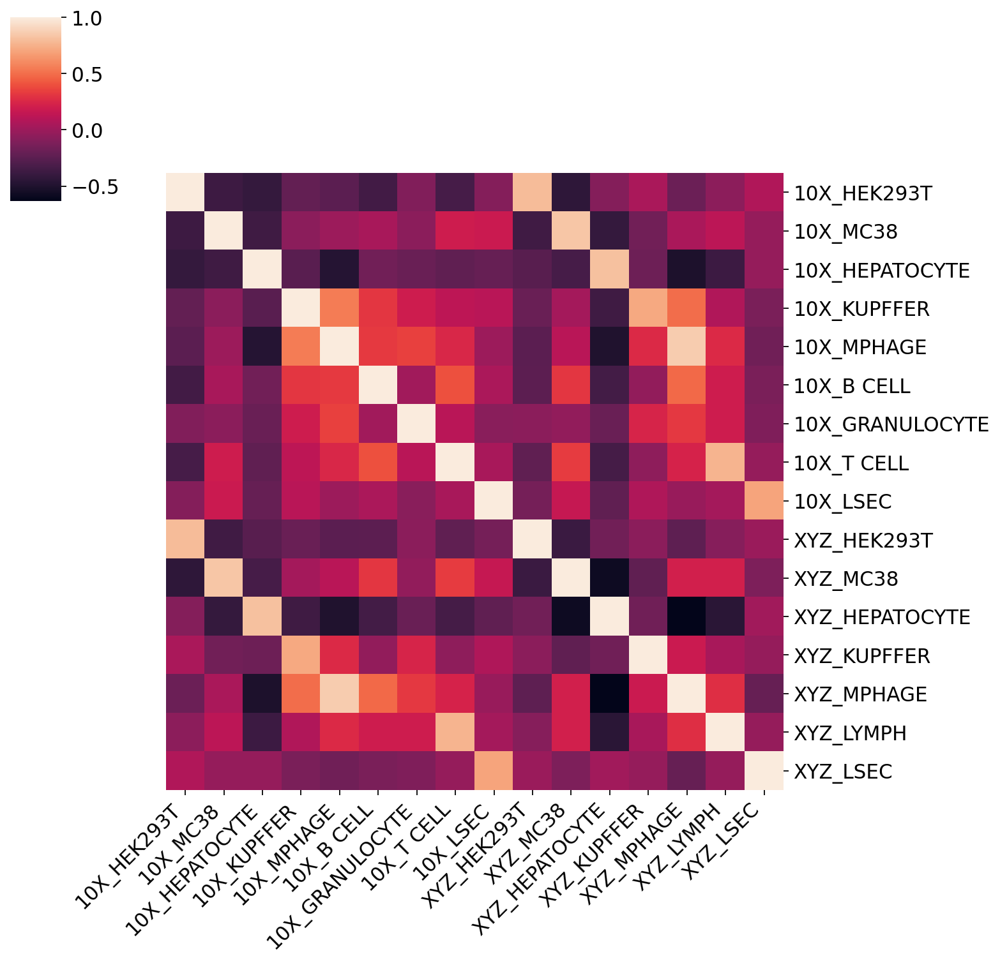

In [114]:
exp_corr = exp_result.corr()
exp_corr.style.background_gradient(cmap='coolwarm').set_precision(2)
# fig, ax = plt.subplots(1,1,figsize=(10,10))
g = sns.clustermap(exp_corr, yticklabels=True, xticklabels=True, row_cluster=False, col_cluster=False);
g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xticklabels(), rotation=45, ha='right');
# g.savefig(prefix + '10x/2020112/figures/10x.L20C1.ct.heatmap.svg')

### Figure 3E

In [23]:
adata = paper_l20c1_umap

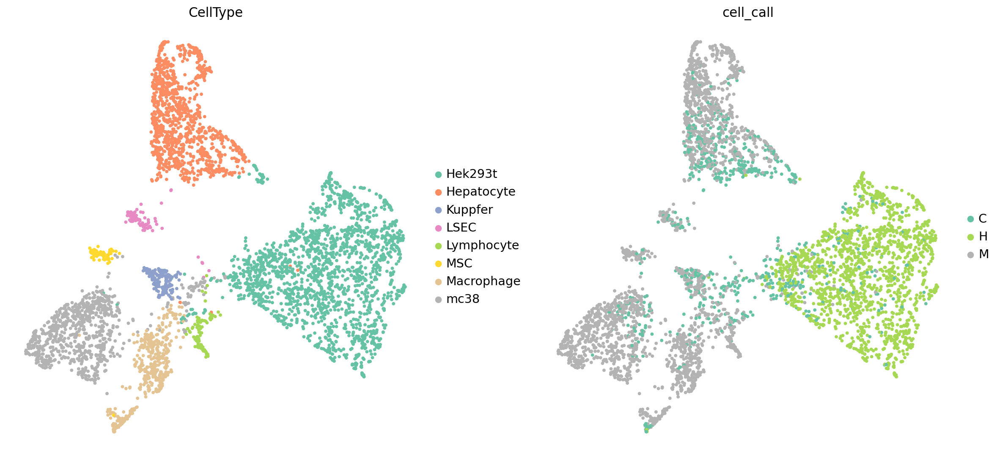

In [24]:
fig, ax = plt.subplots(1, 2, figsize=(15, 7))
for color, ax in zip(['CellType','cell_call'], np.ravel(ax)):
    sc.pl.umap(adata, color=color, palette="Set2",
               color_map=mpl.cm.CMRmap, frameon=False,
#                legend_loc='on data', save='test.svg',
               size=50, ax=ax, show=False, return_fig=False)
plt.tight_layout()

Run this to give colors to all of the leiden categories:

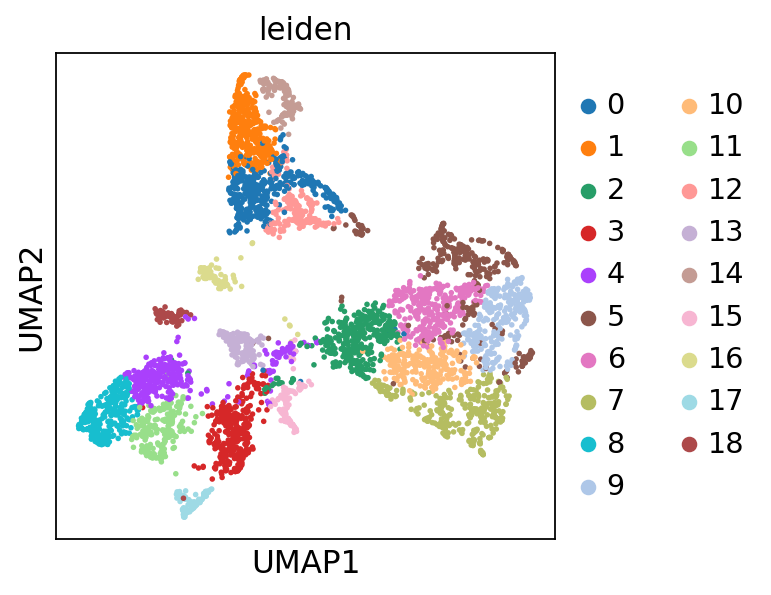

In [12]:
sc.pl.umap(adata, color='leiden');

_GH_: Next three cells might not be necessary?

In [118]:
# adata.uns['CellType_colors']

In [119]:
# adata.uns['CellType_colors']=['#e41a1c',
#                               '#377eb8',
#                               '#984ea3',
#                               '#ff7f00',
#                               '#ffff33',
#                               '#f781bf',
#                               '#4daf4a']

In [120]:
# fig, ax = plt.subplots(1, 2, figsize=(15, 7))
# for color, ax in zip(['CellType','cell_call'], np.ravel(ax)):
#     sc.pl.umap(adata, color=color, frameon=False,
# #                legend_loc='on data', save='test.svg',
#                size=50, ax=ax, show=False, return_fig=False)
# plt.tight_layout()

### Load in the Platemap

In [13]:
plate_map = prefix + 'plate23_map.csv'
spatial_map = pd.read_csv(plate_map, header=None, names=['barcode', 'X', 'Y'])

In [14]:
cutoff = 0

In [15]:
def hexagon(x, y, c='k'):
    points = [[x + (2/3), y],
              [x + (1/3), y + 0.5],
              [x - (1/3), y + 0.5],
              [x - (2/3), y],
              [x - (1/3), y - 0.5],
              [x + (1/3), y - 0.5]]
    
    polygon = Polygon(points, edgecolor='w', fc=c,alpha=0.8)
    return polygon

### Make Images with Hexmaps
_GH_: I saw the same code repeated many times with slight modifications, so to make the notebook more concise I put the code in a function called `color_hexmaps`. I don't think this is super critical since these plots are not in the paper.

In [16]:
def color_hexmaps(adata, df, covar):
    color_iterator=0

    for t in adata.obs[covar].cat.categories:

        df_ = df[df[covar] == t].copy()
        #sets cell counter
        df_.loc[:,'count'] = 1

        df__ = df_.groupby('barcode', as_index=False)['count'].sum()

        map_array = spatial_map.merge(df__, on='barcode', how='left')

        map_array = map_array.fillna('0')
        map_array['count'] = map_array['count'].astype(int)

        # max value for coloring
        max_val=max(map_array['count'])
        norm = mpl.colors.Normalize(vmin=0,vmax=max_val)

        custom_color=adata.uns['%s_colors' % covar][color_iterator]
        custom_map = mpl.colors.LinearSegmentedColormap.from_list("", ["#ffffff",custom_color])

        color_iterator = color_iterator + 1

        count_hex=[]

        for i in map_array['count']:
            if i > cutoff:

                count_hex.append(mpl.colors.rgb2hex(custom_map(norm(i))[:3]))
            #    count_hex.append('#000000')

            else:
                count_hex.append('#ffffff')

        map_array['color']=count_hex

        # only the first one is affecting output
        # aspect ratio stays the same regardless
        plt.figure(figsize=(10, 8)) 

        for index, row in map_array.iterrows():
            if row['X'] % 2 != 0:
                row.loc['Y'] = row['Y'] - 0.5

            polygon = hexagon(row['X'],row['Y'],row['color'])
            plt.gca().add_patch(polygon)

        plt.ylim(18,0) #flip y axis
        plt.axis('scaled')


        plt.ylabel('cell number')
        plt.title(t) 
        plt.axis('off')

    #fix this here...
     #   mesh = plt.pcolormesh(pd.DataFrame(map_array['count']), cmap=custom_map)
     #   plt.colorbar(mesh)

     #   plt.savefig('/Users/derekbogdanoff/Desktop/test.svg', bbox_inches='tight')
        plt.show()

In [17]:
covar = 'CellType'
df = pd.DataFrame(adata.obs[covar])
df['barcode'] = df.index.str[-16:]

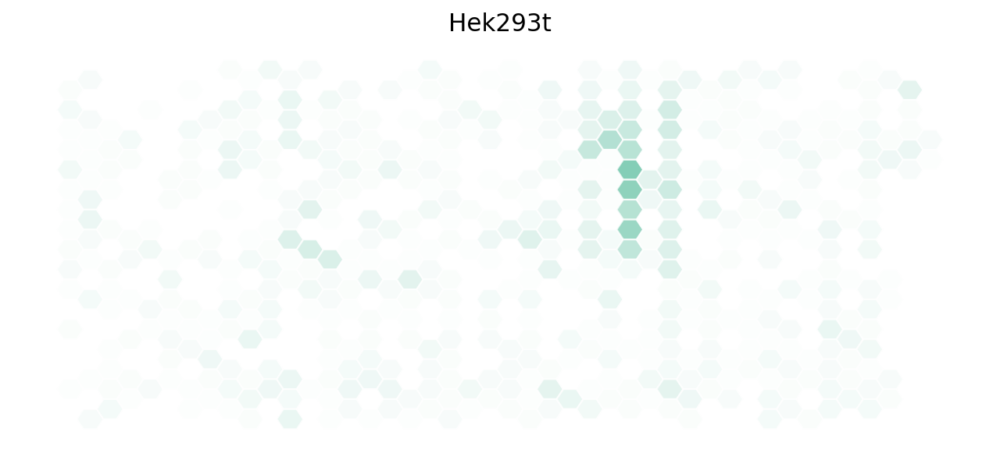

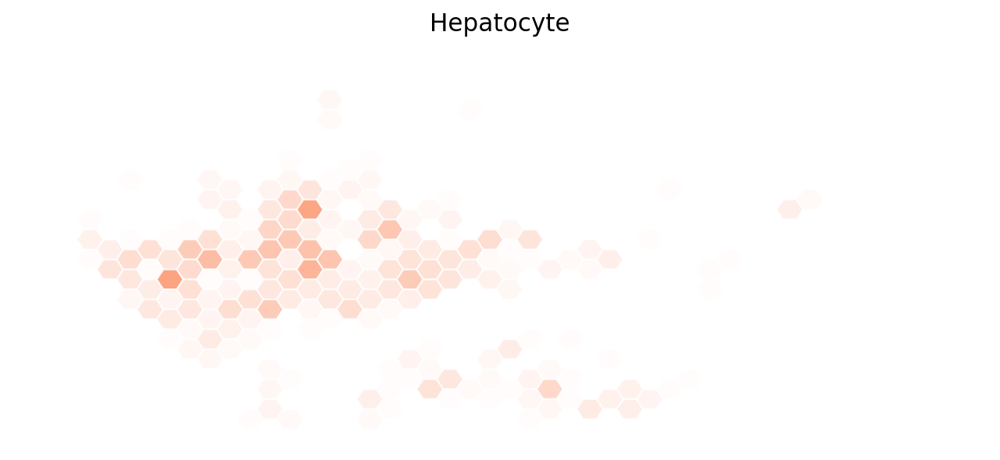

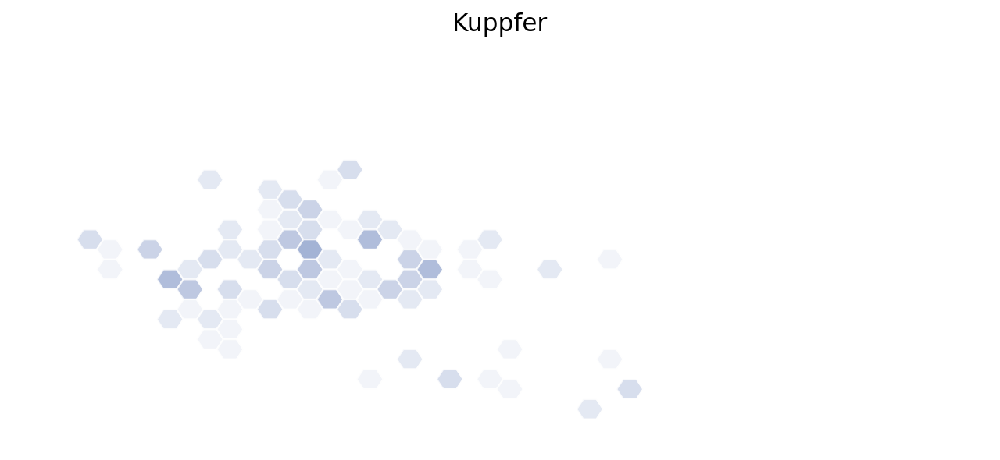

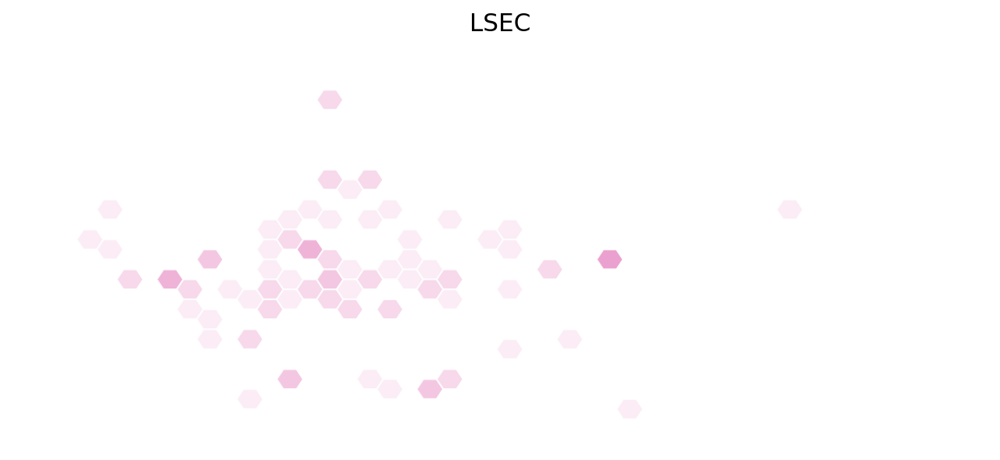

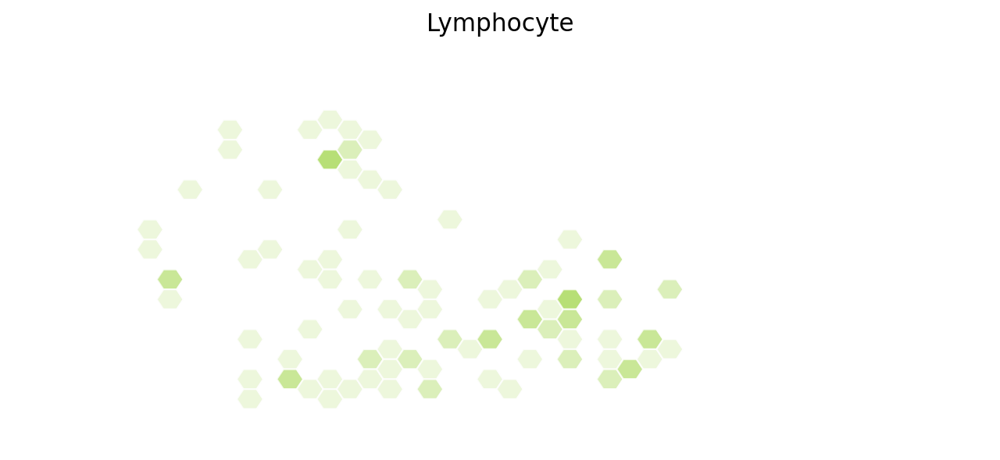

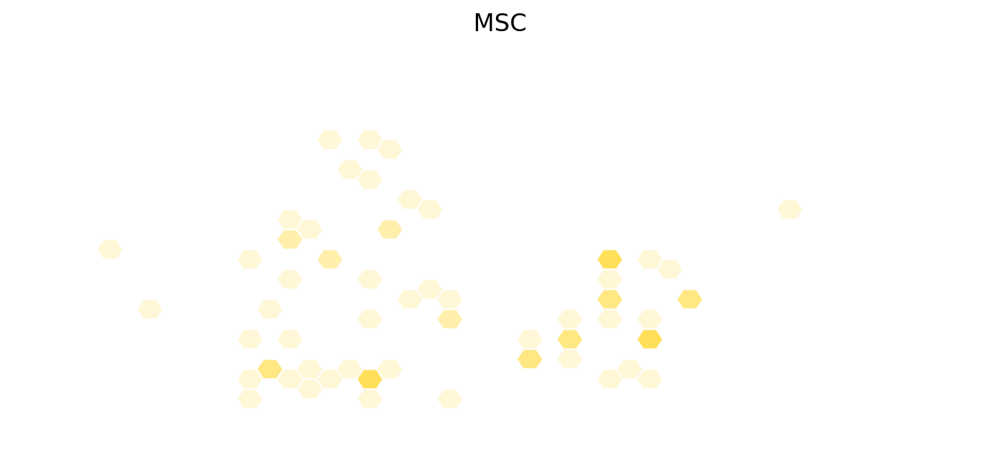

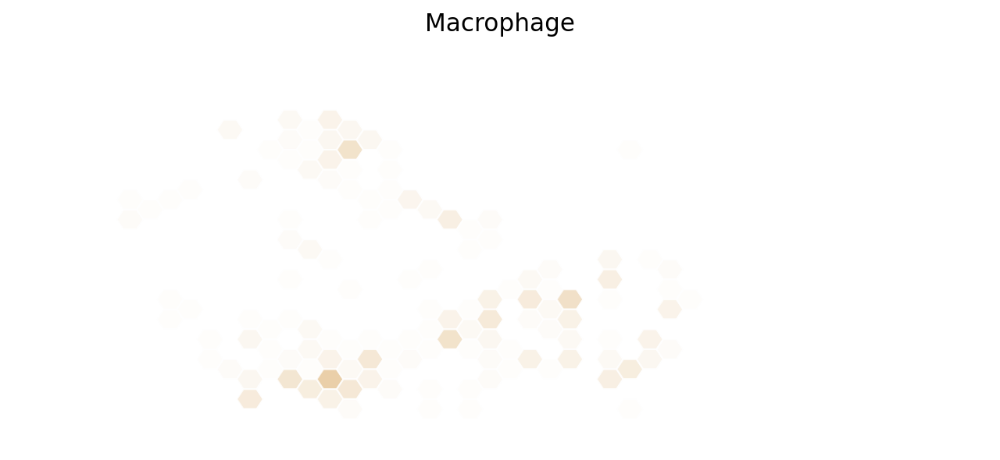

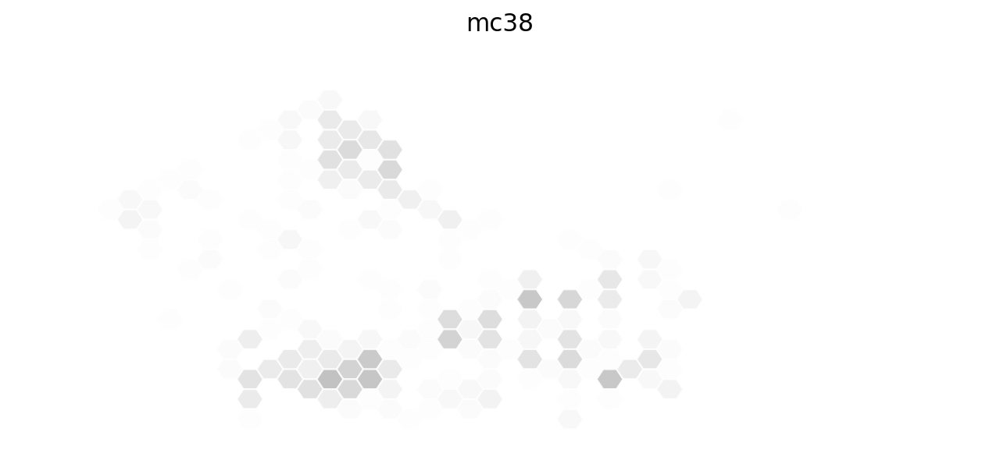

In [126]:
color_hexmaps(adata, df, covar=covar)

_GH_: Next two cells seem related to coloring, don't think I need them right now.

In [127]:
# from pylab import *

# cmap = cm.get_cmap('Set1')    # PiYG

# for i in range(cmap.N):
#     rgb = cmap(i)[:3] # will return rgba, we take only first 3 so we get rgb
#     print(matplotlib.colors.rgb2hex(rgb))

In [128]:
# adata

In [129]:
adata.obs['barcode']=df['barcode']

_GH_: Rank genes groups, not sure why I need that here...

In [130]:
# group = 'CellType'

In [131]:
# sc.tl.rank_genes_groups(adata, groupby=group)

In [132]:
# def rank_genes_groups_df(adata, group, pval_cutoff : float =None, logfc_cutoff=None): 
#     d = pd.DataFrame() 
#     for k in ['scores', 'names', 'logfoldchanges', 'pvals', 'pvals_adj']: 
#         d[k] = adata.uns["rank_genes_groups"][k][group] 
#     if pval_cutoff is not None: 
#         d = d[d["pvals_adj"] < pval_cutoff] 
#     if logfc_cutoff is not None: 
#         d = d[d["logfoldchanges"].abs() > logfc_cutoff] 
#     return d



# de_df = rank_genes_groups_df(adata, group)

# de_df.hvplot.scatter(
#     "logfoldchanges", "pvals", 
#     flip_yaxis=True, logy=True, 
#     hover_cols=["names"]
# )

### Bring in the Image

_GH_: The file is not on the Box subfolder with data. 

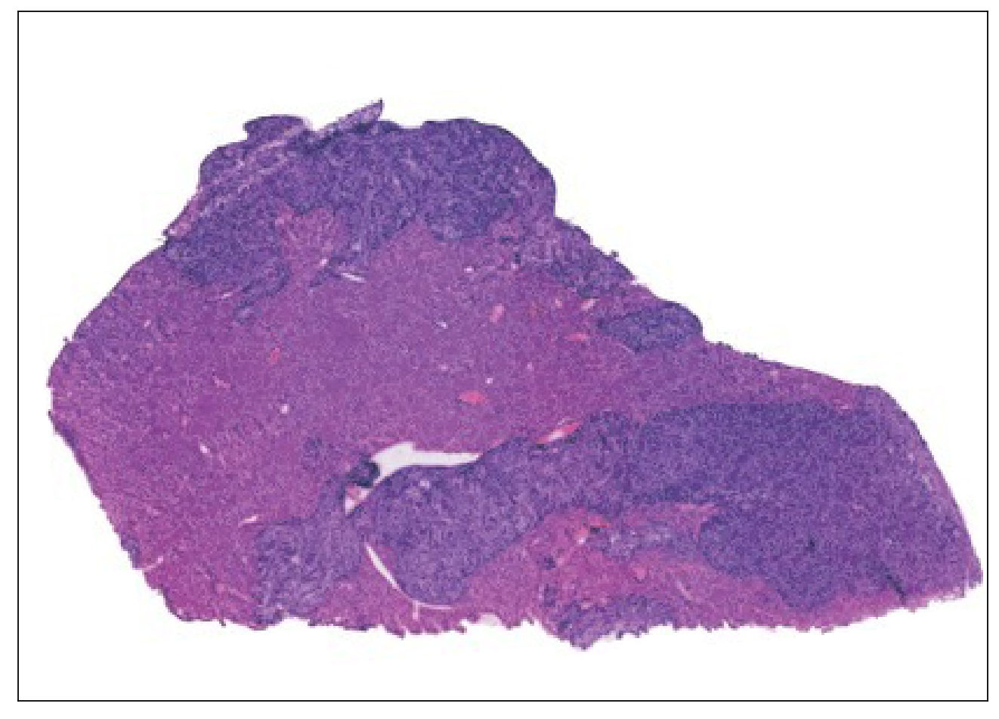

In [165]:
import scipy.misc
from scipy import ndimage
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.offsetbox import (TextArea, DrawingArea, OffsetImage,
                                  AnnotationBbox)

####layer 1 

img =  mpimg.imread(prefix + 'h_and_e_liver.jpg') #scipy.misc.face()  # lena is not included in scipy 0.19.1
tr = scipy.ndimage.rotate(img,5,cval=255)
imgplot=plt.imshow(tr,zorder=1)
plt.grid(False)
ax = plt.gca()
ax.get_yaxis().set_visible(False)
ax.get_xaxis().set_visible(False)


####layer 2

#plt.scatter(test['x'],test['y'],s=400,c='yellow',zorder=2)
#plt.ylim(18,0) #flip y axis

/home/ssm-user/anaconda3/envs/xyzeq/lib/python3.6/site-packages/ipykernel_launcher.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/ssm-user/anaconda3/envs/xyzeq/lib/python3.6/site-packages/ipykernel_launcher.py:67: UserWarning: Requested projection is different from current axis projection, creating new axis with requested projection.


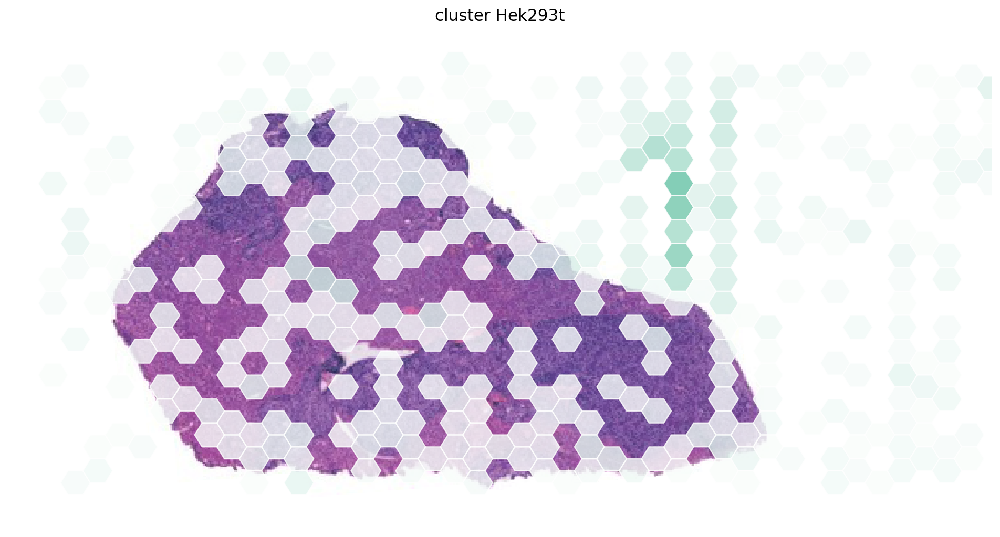

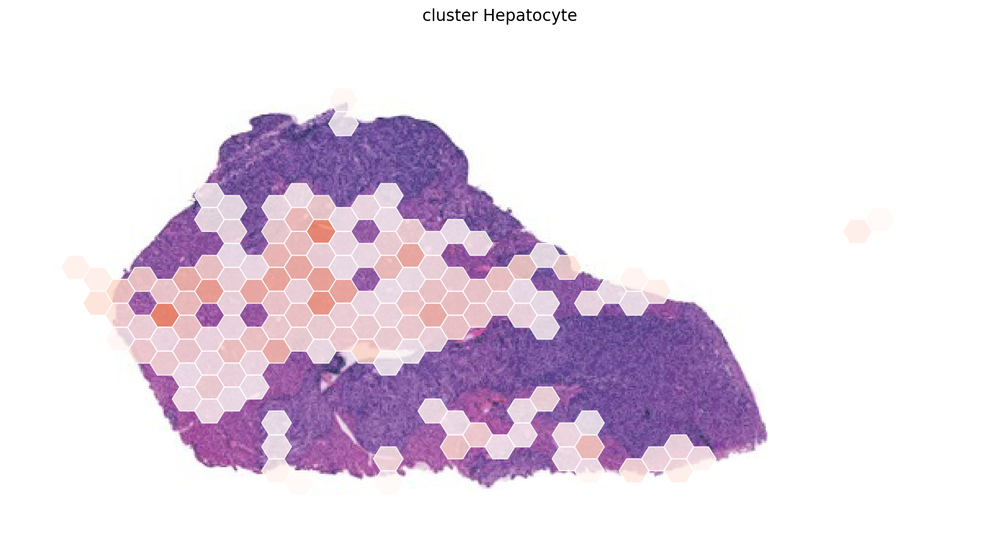

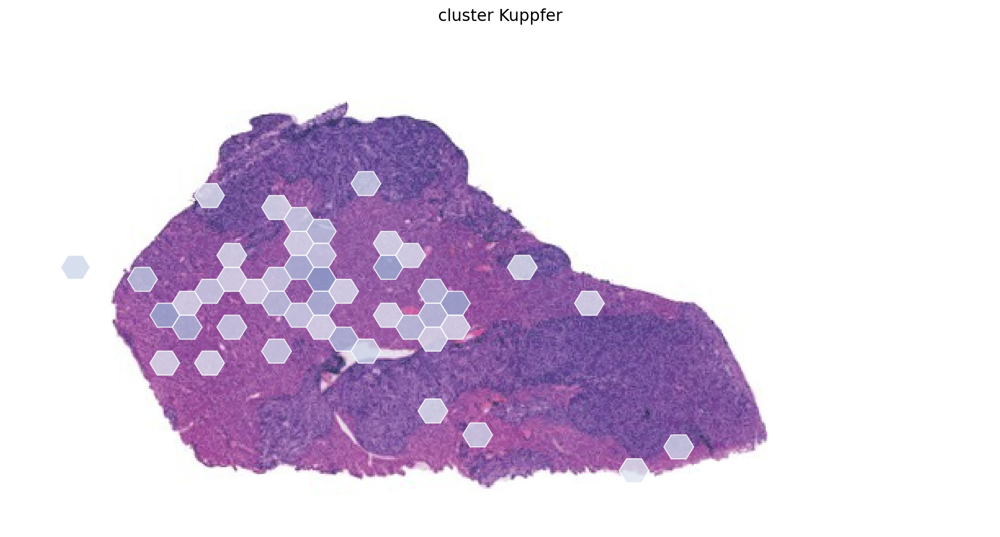

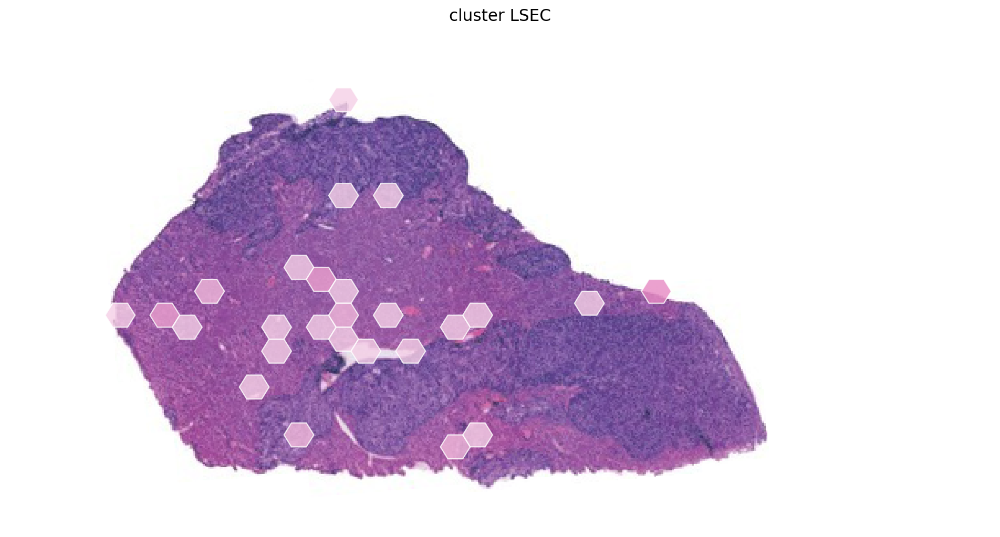

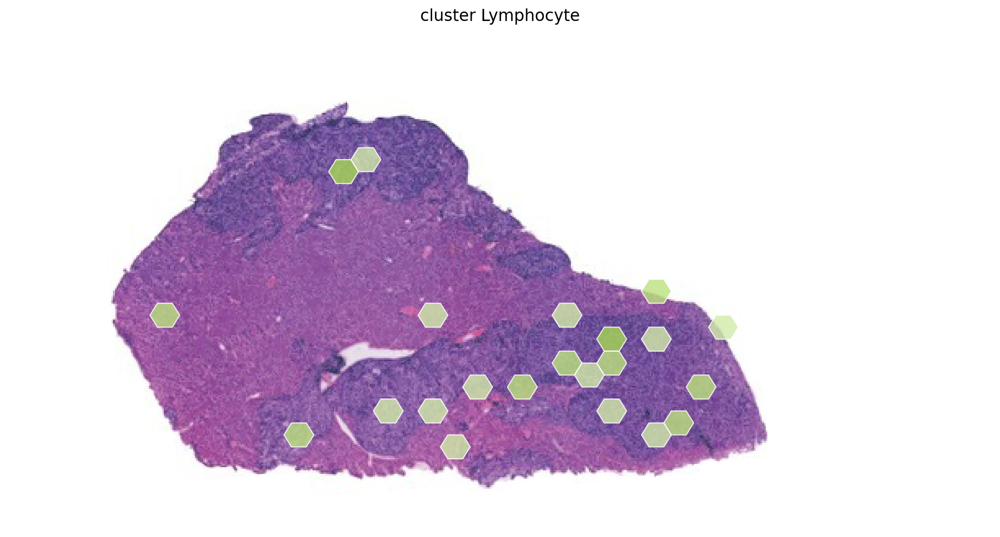

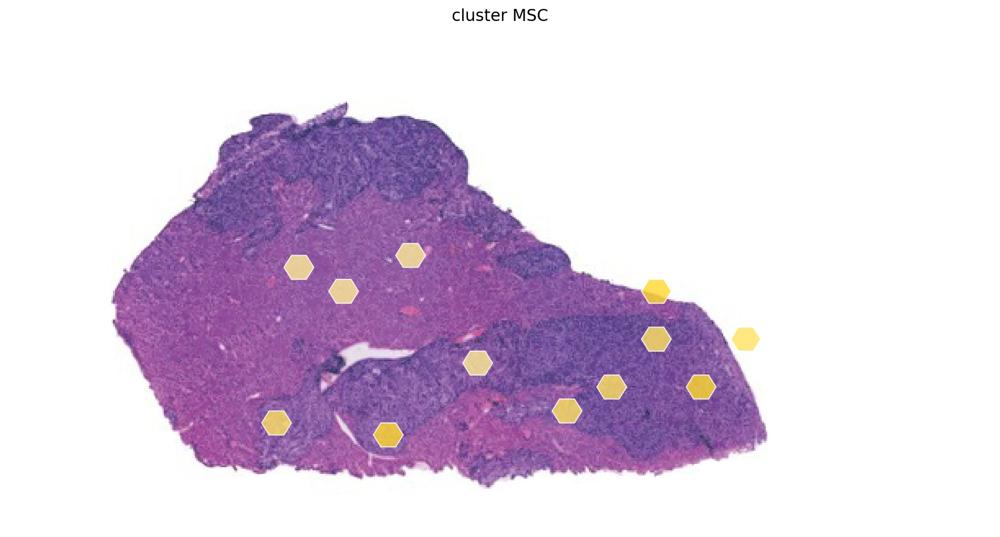

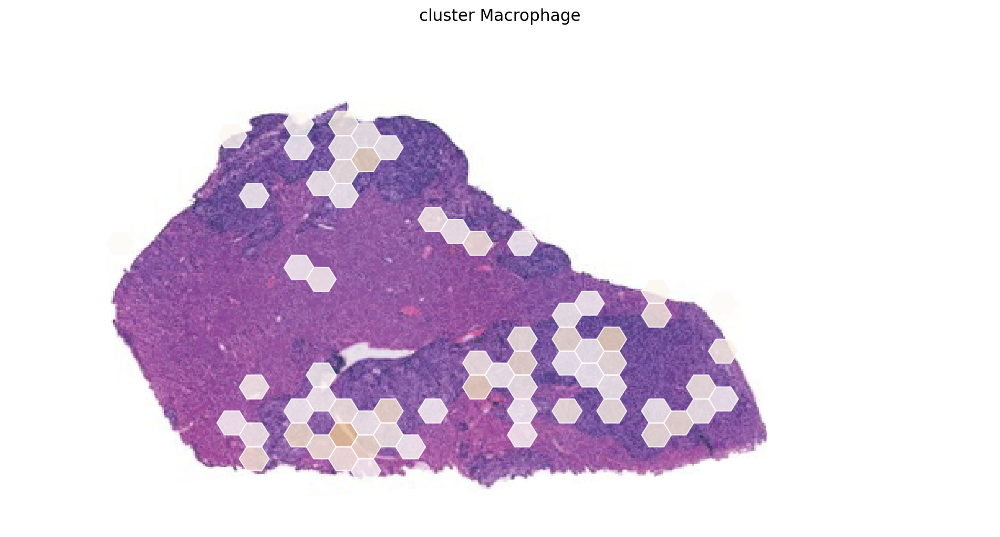

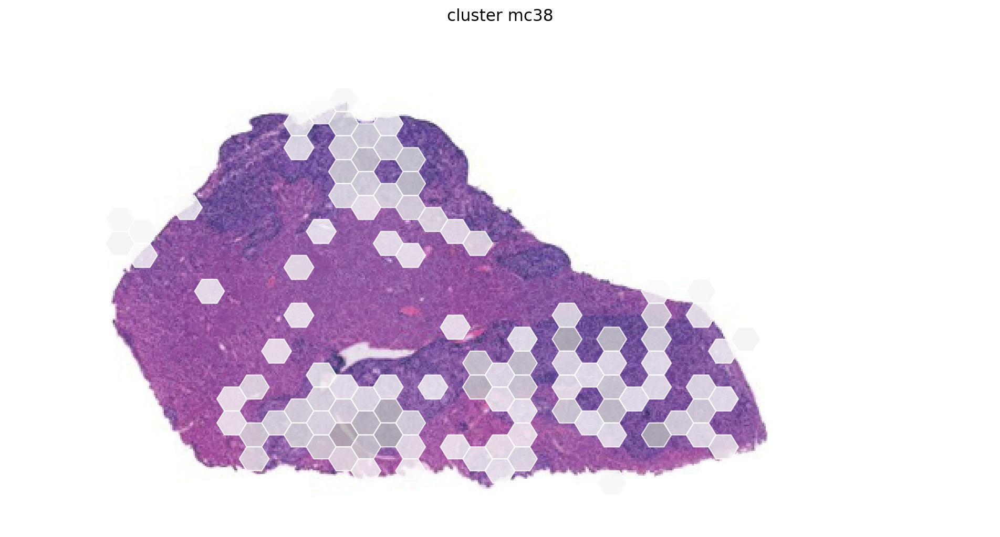

In [164]:
color_itorator=0

# fig, ax = plt.subplots()
# xy = [0.45, 0.52] #### XY positions!!

# arr_img = tr
# imagebox = OffsetImage(arr_img,zoom=1.5) #####Zoom!!
# ab = AnnotationBbox(imagebox, xy, frameon=False)
# ax.add_artist(ab)
# ax.axis('off')

for t in adata.obs.CellType.cat.categories:
#for t in ['1']:
    df_=df[df['CellType'] == t]
 
    fig, ax = plt.subplots()
    xy = [0.43, 0.47] #### XY positions!!

    arr_img = tr
    imagebox = OffsetImage(arr_img,zoom=1.4) #####Zoom!!
    ab = AnnotationBbox(imagebox, xy, frameon=False)
    ax.add_artist(ab)
    ax.axis('off')

    df_=df[df['CellType'] == t]
    
    #sets cell counter
    df_['count']=1
    
    df__=df_.groupby('barcode', as_index=False)['count'].sum()

    map_array=spatial_map.merge(df__, on='barcode', how='left')
    
    map_array=map_array.fillna('0')
    map_array['count']=map_array['count'].astype(int)
    
    # max value for coloring
    max_val=max(map_array['count'])
    norm = mpl.colors.Normalize(vmin=0,vmax=max_val)
    
    custom_color=adata.uns['CellType_colors'][color_itorator]
    custom_map = mpl.colors.LinearSegmentedColormap.from_list("", ["#ffffff",custom_color])
    
    color_itorator = color_itorator+1
    
    #remove zero count wells
    map_array=map_array[map_array['count']>1]
    
    count_hex=[]
    for i in map_array['count']:
        if i > cutoff:

            count_hex.append(mpl.colors.rgb2hex(custom_map(norm(i))[:3]))
        #    count_hex.append('#fc7703')
            
        else:
            count_hex.append('#ffffff')

    map_array['color']=count_hex
    
    for index, row in map_array.iterrows():
        if row['X'] % 2 != 0:
            row['Y']=row['Y']-0.5
    
        polygon = hexagon(row['X'],row['Y'],row['color'])
        
        plt.gca(zorder=2).add_patch(polygon)
    
    plt.ylim(19,-1) #flip y axis
    plt.xlim(-1,43)
    plt.rcParams['figure.figsize'] = [15, 7.5] 
    
    plt.ylabel('cell number')
    plt.title('cluster %s' %t) 
    plt.axis('off')
    
    plt.show()

_GH_: Just using my function here below for the `cell_call` covariate:

In [135]:
covar = 'cell_call'
df = pd.DataFrame(adata.obs[covar])
df['barcode'] = df.index.str[-16:]

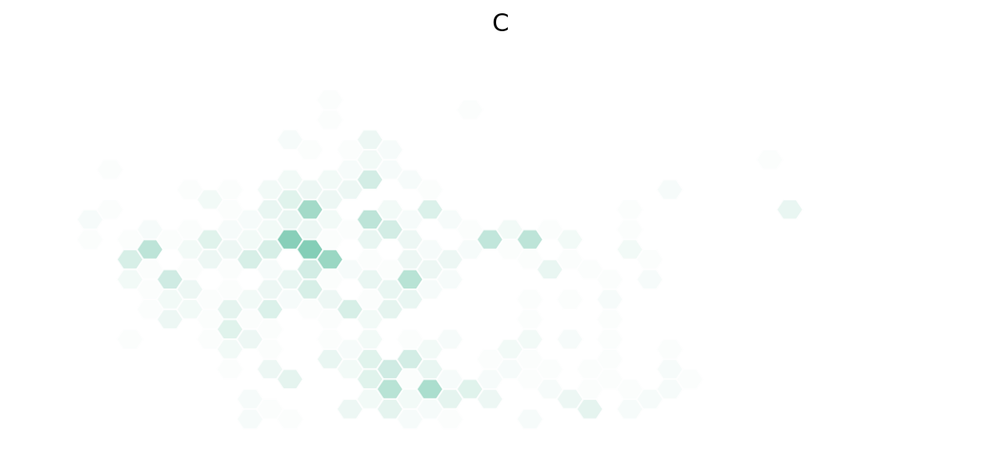

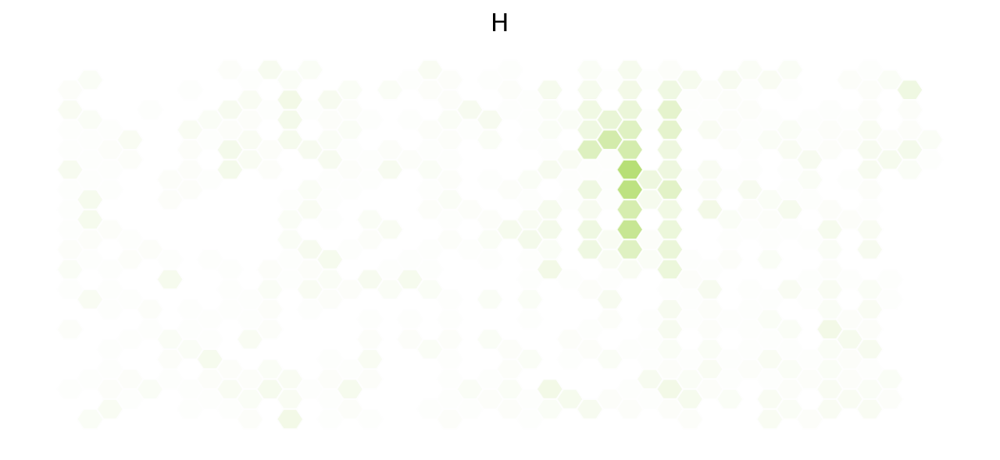

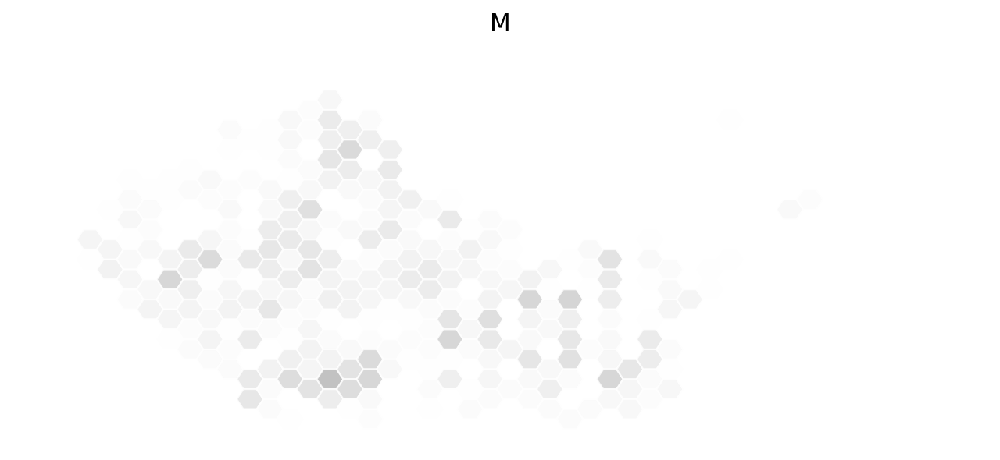

In [136]:
color_hexmaps(adata, df, covar=covar)

_GH_: Here is my function again for Leiden clusters, but leaving the original code there (just commented out and collapsed) because it references a variable called `adata_filtered` which is not defined anywhere, so we'll have to address that if its important.

In [137]:
covar = 'leiden'
df = pd.DataFrame(adata.obs[covar])
df['barcode'] = df.index.str[-16:]

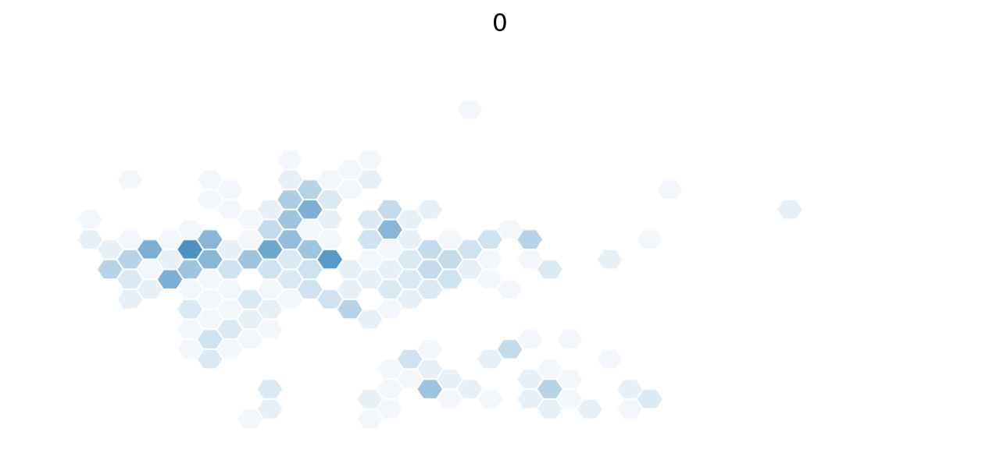

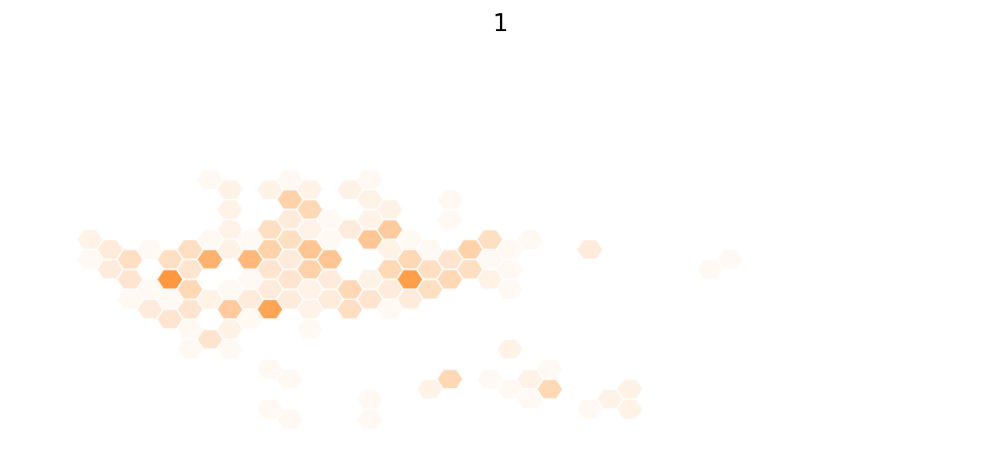

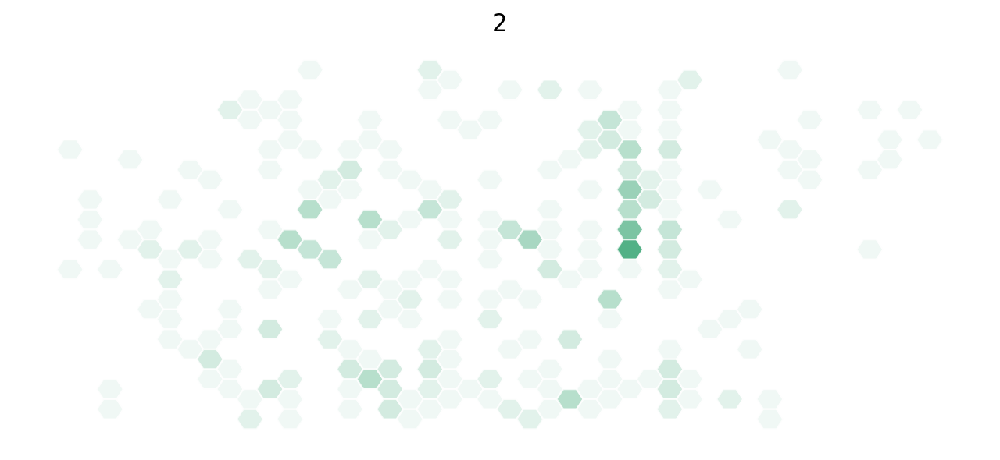

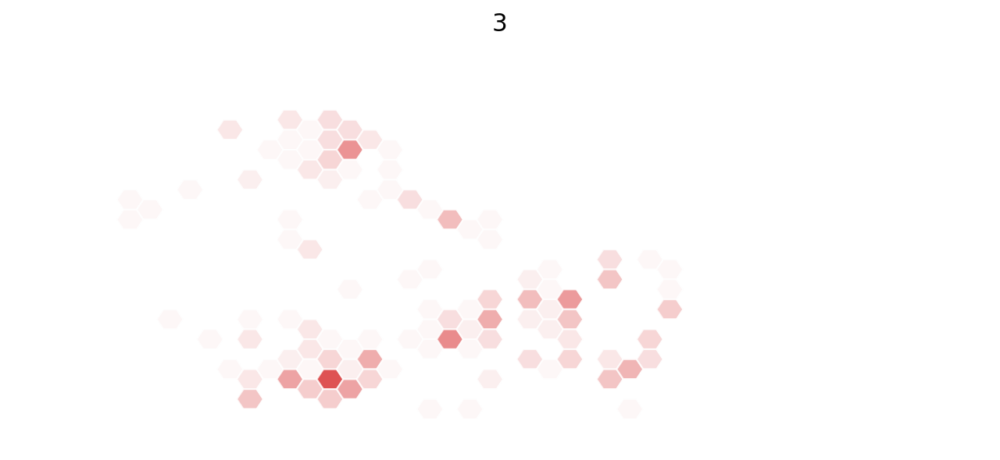

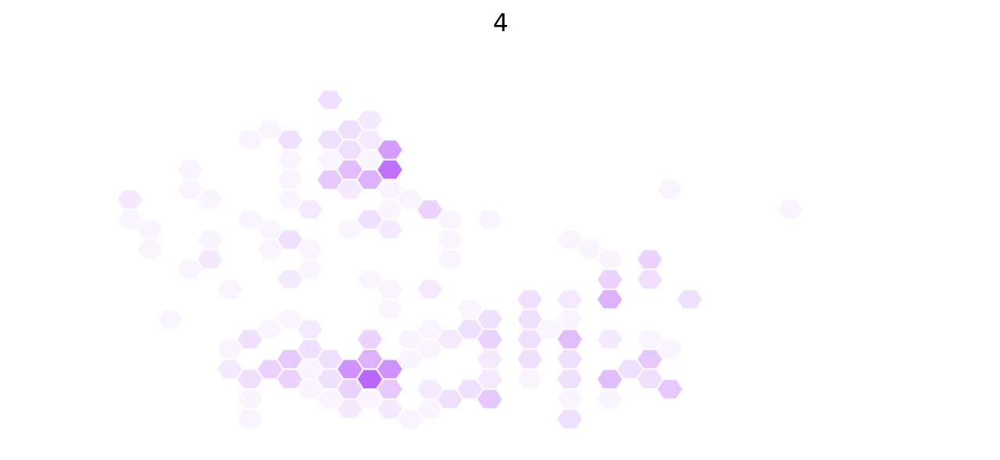

...

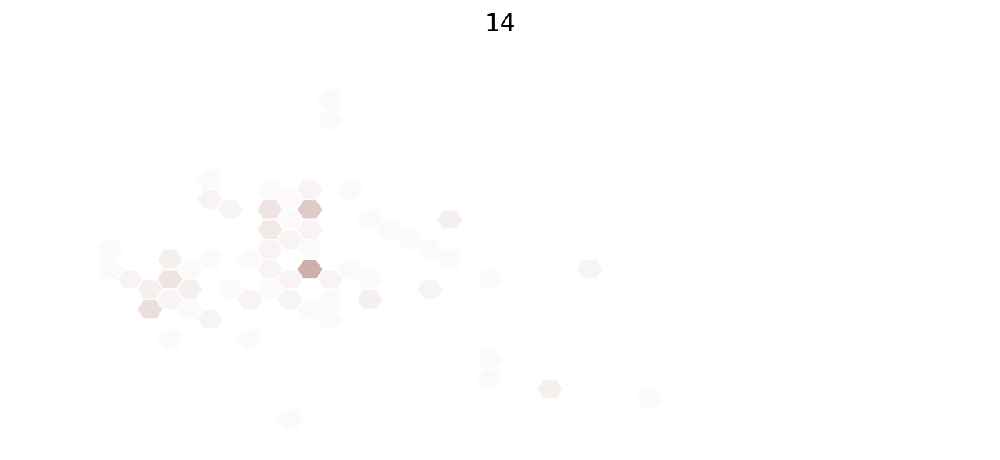

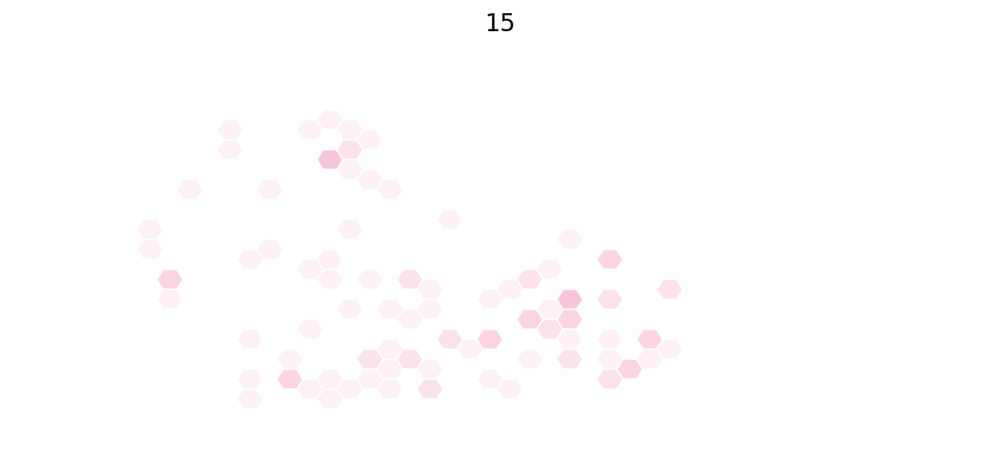

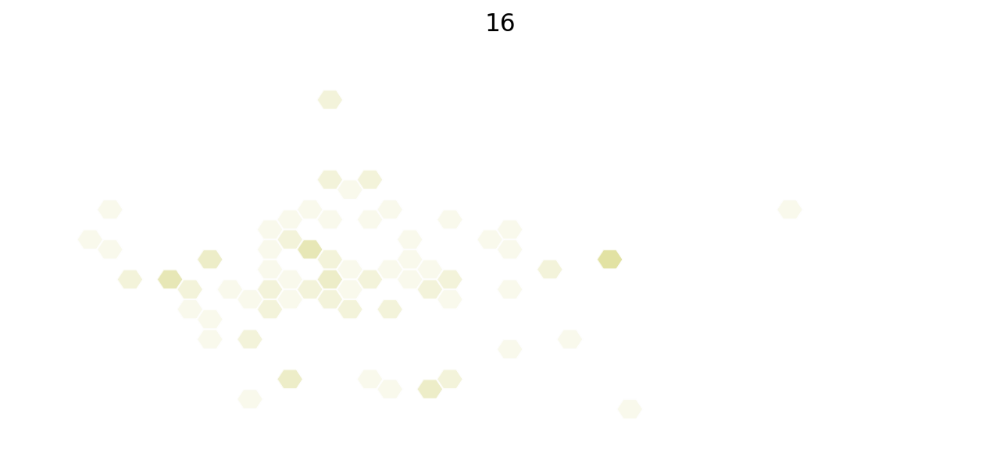

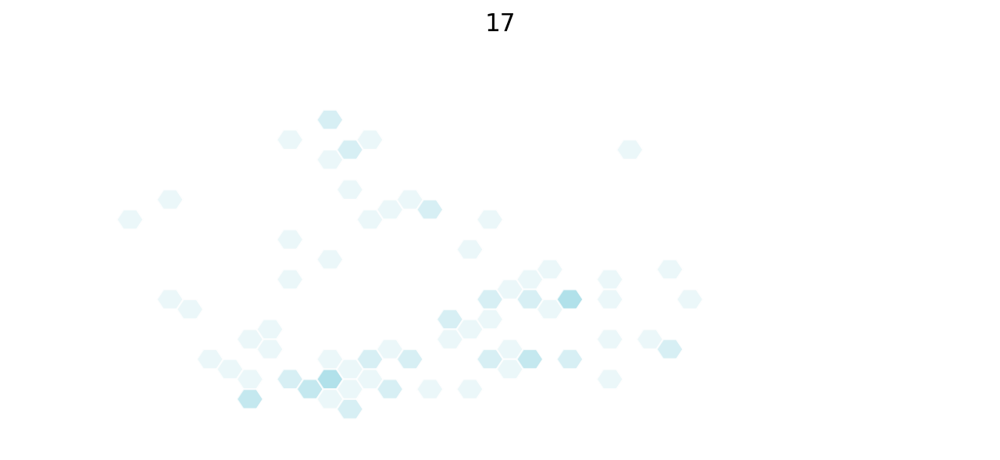

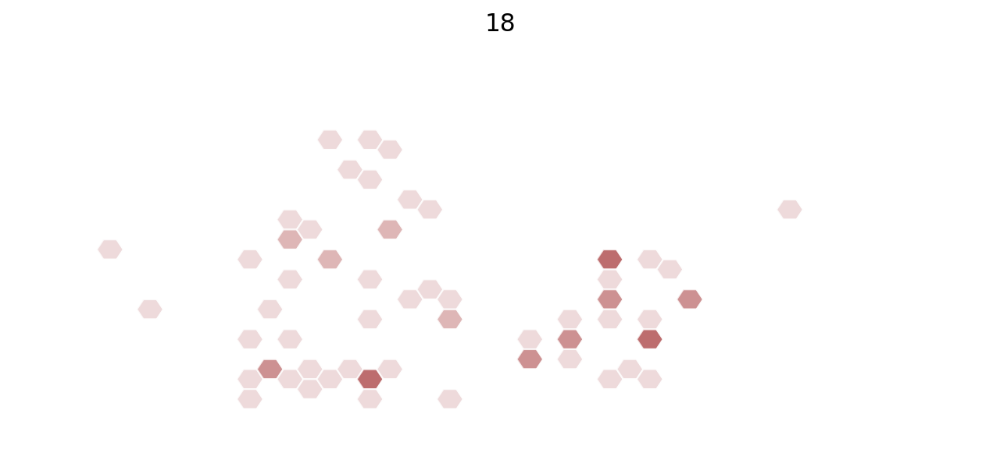

In [151]:
color_hexmaps(adata, df, covar=covar)

In [ ]:
# # for t in adata_filtered.obs.leiden.unique():        #for each unique feature in adata.obs
# for t in adata.obs.leiden.unique():        #for each unique feature in adata.obs
#     df_=df[df['leiden'] == t]
#     df_['count']=1
    
#     df__=df_.groupby('barcode', as_index=False)['count'].sum()
# #    df__.columns=['barcode','count']
#     map_array=spatial_map.merge(df__, on='barcode', how='left')
    
#     map_array=map_array.fillna('0')
#     map_array['count']=map_array['count'].astype(int)
    
#     max_val=max(map_array['count'])
#     norm = mpl.colors.Normalize(vmin=0,vmax=max_val)

#  #   cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["white","#1f77b4"])

#     count_hex=[]
#     for i in map_array['count']:
#         if i > cutoff:

#             count_hex.append(mpl.colors.rgb2hex(cm.Greys(norm(i))[:3]))
#             #count_hex.append('#E6E6FA')
            
#         else:
#             count_hex.append('#ffffff')

#     map_array['color']=count_hex
    
#     for index, row in map_array.iterrows():
#         if row['X'] % 2 != 0:
#             row['Y']=row['Y']-0.5
    
#         polygon = hexagon(row['X'],row['Y'],row['color'])
#         plt.gca().add_patch(polygon)

#     plt.ylim(18,0) #flip y axis
#     plt.axis('scaled')
#     plt.rcParams['figure.figsize'] = [15, 7.5] 
#     plt.title('leiden cluster %s' %t) 
#     plt.axis('off')
    
#  #   plt.colorbar()
    

#     plt.show()

### Pie Chart 

In [18]:
covar = 'CellType'
df = pd.DataFrame(adata.obs[covar])
df['barcode'] = df.index.str[-16:]

In [19]:
df_with_coords = df.merge(spatial_map,on='barcode',how='right')
df_with_coords['count'] = 1
df_with_coords['CellType'] = df_with_coords['CellType'].cat.add_categories('None').fillna('None')
df_with_coords['count'] = df_with_coords['count'].fillna(int(1))
df_counts = df_with_coords.groupby(['CellType', 'X', 'Y']).sum().fillna(0)

In [20]:
color_dict = dict(zip(df['CellType'].value_counts().index.tolist() + ['None'], 
                      adata.uns['CellType_colors'] + ['#ffffff']))

In [25]:
color_dict

{'Hek293t': '#66c2a5',
 'Hepatocyte': '#fc8d62',
 'mc38': '#8da0cb',
 'Macrophage': '#e78ac3',
 'Kuppfer': '#a6d854',
 'Lymphocyte': '#ffd92f',
 'LSEC': '#e5c494',
 'MSC': '#b3b3b3',
 'None': '#ffffff'}

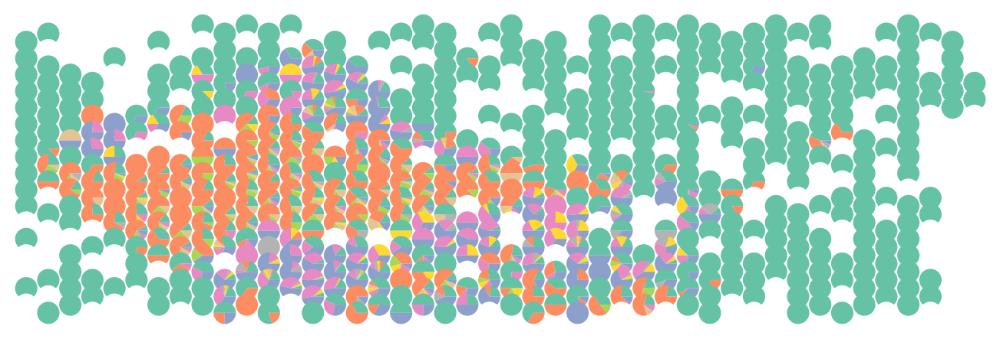

In [21]:
fig8 = plt.figure(constrained_layout=False, figsize=(15, 7.5))
gs1 = fig8.add_gridspec(nrows=36, ncols=44, left=-0.05, right=0.48, hspace=-0.98,wspace=-.21)

for index, row in tqdm(spatial_map.iterrows()):
    x_coordinate = row['X']-1
    
    if (row['X']-1)  % 2 == 0:
        y_coordinate = ((row['Y']-1)*2)
    else:
        y_coordinate = ((row['Y']*2)-1)
    
    counts = df_counts.xs([row['X'], row['Y']], 
                          level=['X','Y'])['count']
    
    color_list=[]
    for i in counts.index:
        color_list.append(color_dict[i])
    
    
    ax = fig8.add_subplot(gs1[y_coordinate,x_coordinate])
    ax.pie(counts.values, colors=color_list)
    
    
  #  df__.loc[barcode].plot.pie('count')
# fig8.savefig('/Users/derekbogdanoff/Desktop/test.svg', bbox_inches='tight')

_GH_: Code to make jitter hexmap below, but not running because it's not in the paper.

In [ ]:
# _df=df.merge(spatial_map,on='barcode',how='right')

# _df['count']=1

# _df['CellType']=_df['CellType'].cat.add_categories('None').fillna('None')
# _df['count']=_df['count'].fillna(int(1))

# df_=_df.groupby(['barcode','CellType'])['count'].sum()

# df__=pd.DataFrame(df_)


In [ ]:
# def rand_jitter(arr):
#     stdev = .005*(max(arr)-min(arr))
#     return arr + np.random.randn(len(arr)) * stdev

In [ ]:
#_df

In [ ]:
# list_=[]

# for index, row in _df.iterrows():
#     if row['X'] % 2 != 0:
#         row['Y']=row['Y']-0.5
#     else:  
#         row['Y']=row['Y']
        
#     list_.append(row['Y'])

In [ ]:
# _df['Y']=list_

In [ ]:
# _df['Y']=_df['Y']/2

In [ ]:
# test=_df

In [ ]:
# test['color']=test['CellType'].map(color_dict)

In [ ]:
# test['X']=rand_jitter(test['X'])
# test['Y']=rand_jitter(test['Y'])

In [ ]:
# test.plot.scatter(x='X',y='Y',c=test['color'], s=60,alpha=.6)
# plt.ylim(18,0)

# plt.axis('off')
# plt.grid(b=None)

In [ ]:
# test[test['CellType']=='mc38'].plot.scatter(x='X',y='Y',c=test[test['CellType']=='mc38']['color'], s=60)
# plt.ylim(18,0)

# plt.axis('off')
# plt.grid(b=None)

In [ ]:
# test[test['CellType']=='Hepatocyte'].plot.scatter(x='X',
#                                                   y='Y',
#                                                   c=test[test['CellType']=='Hepatocyte']['color'],
#                                                   s=50)
# plt.ylim(18,0)

# plt.axis('off')
# plt.grid(b=None)

In [ ]:
# test[test['CellType']=='Hek293t'].plot.scatter(x='X',
#                                            y='Y',
#                                                c=test[test['CellType']=='Hek293t']['color'],
#                                                s=50)
# plt.ylim(18,0)

# plt.axis('off')
# plt.grid(b=None)